In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import numpy as np
import pandas as pd
from toolbox.figures import set_matplotlib_style, set_dtu_colors
import json
import os
import seaborn as sns
from toolbox.machine_learning import get_features_sets, get_data
set_matplotlib_style()
dtu_colors = set_dtu_colors()

import warnings
warnings.filterwarnings('ignore')

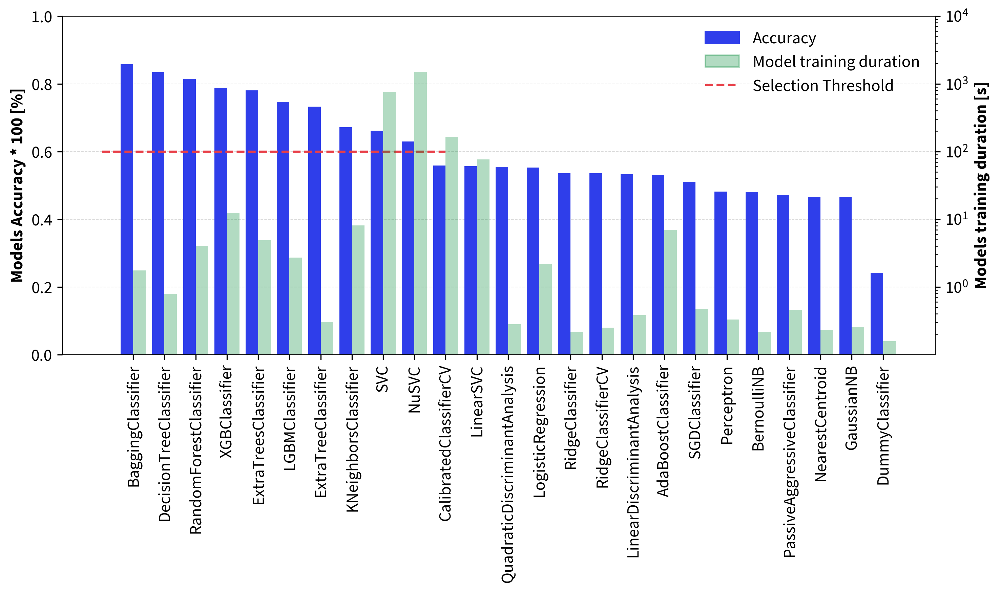

In [2]:
#%% Models Comparative Analysis
# Load data
models = pd.read_csv('../results/models/ml_comparative_analysis.csv')

# Order the models by accuracy
models = models.sort_values(by=['Accuracy'], ascending=False)
# Plot the results
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

bar_width = 0.4

ax1.bar(models['Model'], models['Accuracy'], color=dtu_colors['dtu_blue'], width=-bar_width, align='edge')
ax2.bar(models['Model'], models['Time Taken'], color=dtu_colors['dtu_green'], width=bar_width, align='edge', alpha=0.3)
ax1.hlines(0.6, -1, 10, colors=dtu_colors['dtu_red'], linestyles='dashed', label='Selection Threshold')

ax1.set_ylabel('Models Accuracy * 100 [%]')
ax1.set_ylim([0, 1])
ax1.set_xticklabels(models['Model'], rotation=90)
ax1.grid(True)
ax1.xaxis.grid(False)

ax2.set_ylabel('Models training duration [s]')
ax2.set_yscale('log')
ax2.set_yticks(np.logspace(0, 4, 5))
ax2.grid(False)

# Create legend handles and labels
blue_bar = mpatches.Patch(color=dtu_colors['dtu_blue'], label='Accuracy')
green_bar = mpatches.Patch(color=dtu_colors['dtu_green'], label='Model training duration', alpha=0.3)
red_line = mlines.Line2D([], [], color=dtu_colors['dtu_red'], linestyle='dashed', label='Selection Threshold')

# Create a single legend for all handles and labels
handles = [blue_bar, green_bar, red_line]
labels = [handle.get_label() for handle in handles]
ax1.legend(handles=handles, labels=labels, loc='upper right')

# ax1.set_title('Models Accuracy and respective Computing time')
plt.tight_layout()
plt.savefig('../figures/machine_learning/ml_comparative_analysis.png', dpi=300)
plt.show()

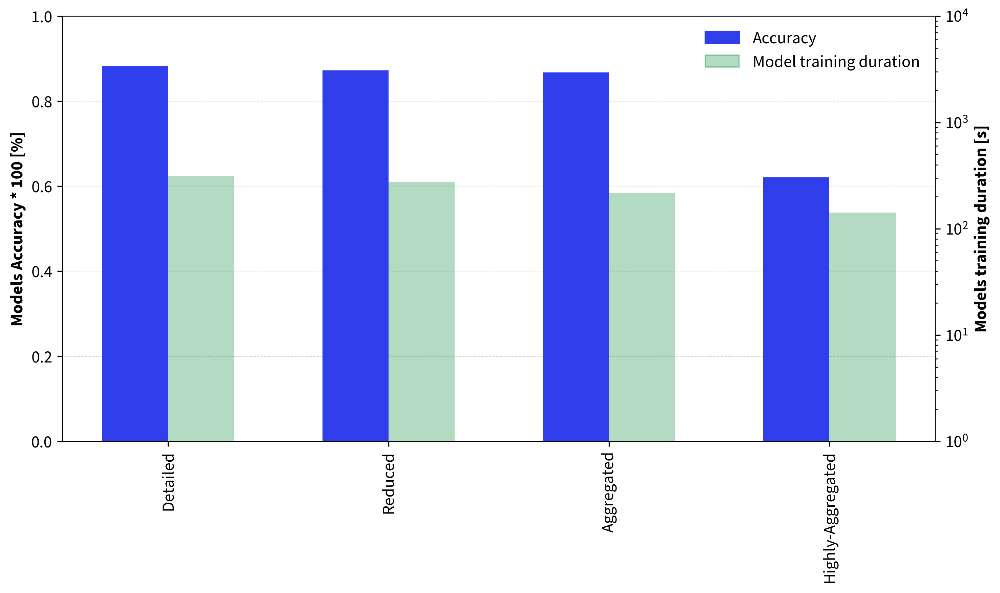

In [3]:
#%% Plot for 4 features sets the accuracy, duration
# Load data from json files in ../results/features/
files = os.listdir('../results/features/')
files = [file for file in files if file.endswith('.json')]

# Get the sets names
sets = [file.split('.')[0] for file in files]
sets = [set.split('_')[-1] for set in sets]

# Load the data from the json files
accuracies = []
durations = []
for file in files:
    with open('../results/features/' + file) as f:
        data = json.load(f)
    accuracies.append(data['accuracy'])
    durations.append(data['duration'])

# Order to have th detailed than medium than simple than elementary
sets = [sets[1], sets[3], sets[0], sets[2]]
accuracies = [accuracies[1], accuracies[3], accuracies[0], accuracies[2]]
durations = [durations[1], durations[3], durations[0], durations[2]]

# Plot the results
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

bar_width = 0.3
ax1.bar(sets, accuracies, color=dtu_colors['dtu_blue'], width=-bar_width, align='edge')
ax2.bar(sets, durations, color=dtu_colors['dtu_green'], width=bar_width, align='edge', alpha=0.3)


ax1.set_ylabel('Models Accuracy * 100 [%]')
ax1.set_ylim([0, 1])
ax1.set_xticklabels(sets, rotation=90)
ax1.grid(True)
ax1.xaxis.grid(False)

ax2.set_ylabel('Models training duration [s]')
ax2.set_yscale('log')
ax2.set_yticks(np.logspace(0, 4, 5))
ax2.grid(False)

# Create legend handles and labels
blue_bar = mpatches.Patch(color=dtu_colors['dtu_blue'], label='Accuracy')
green_bar = mpatches.Patch(color=dtu_colors['dtu_green'], label='Model training duration', alpha=0.3)

# Create a single legend for all handles and labels
handles = [blue_bar, green_bar]
labels = [handle.get_label() for handle in handles]
ax1.legend(handles=handles, labels=labels, loc='upper right')
# tight_layout
plt.tight_layout()
# ax1.set_title('Accuracy and Duration for each features set')
plt.savefig('../figures/features_selection/features_sets_accuracy_duration.png', dpi=300)
plt.show()


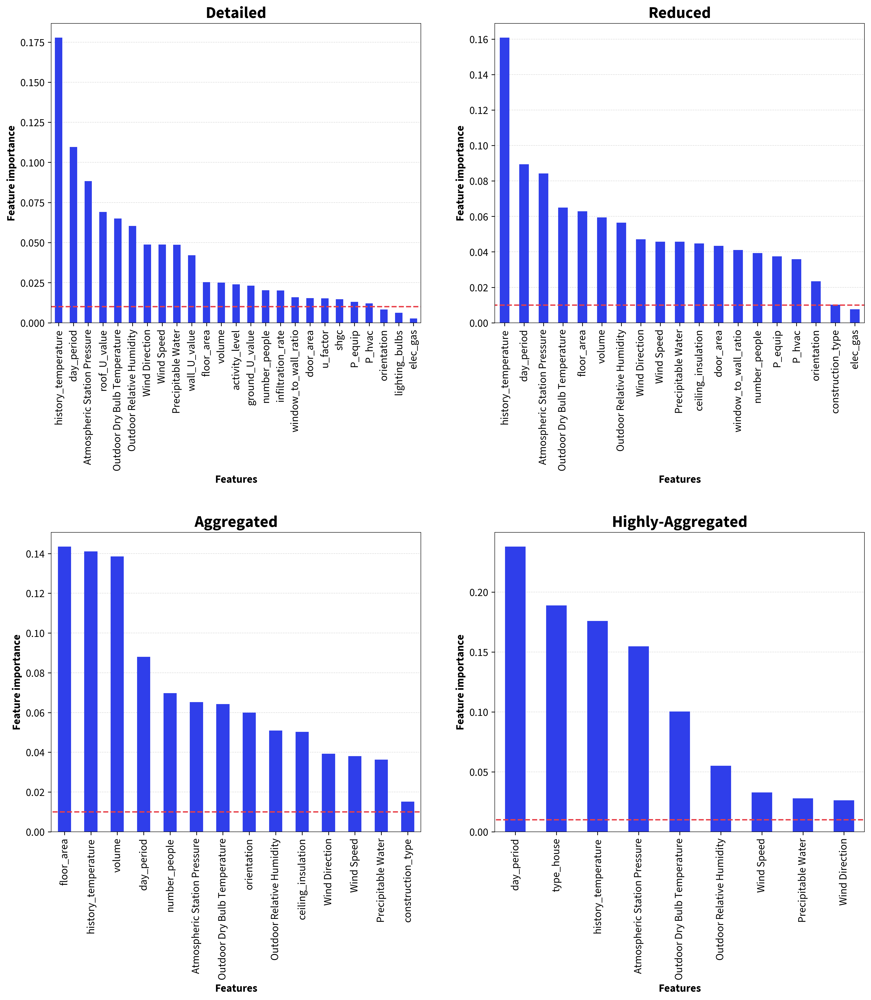

In [4]:
#%% Plot the feature importance for the different models in 4 subplots
# Load data
files = os.listdir('../results/features/')
files = [file for file in files if file.startswith('feature_importances_')]

# Get the sets names
sets = [file.split('.')[0] for file in files]
sets = [set.split('_')[-1] for set in sets]

# Load the data from the csv files
feature_importances = {}
for i, file in enumerate(files):
    feature_importances[sets[i]] = pd.read_csv('../results/features/' + file)

for item in sets:
    feature_importances[item] = feature_importances[item].set_index('Unnamed: 0')

# Order the sets
sets = [sets[1], sets[3], sets[0], sets[2]]

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
axs = axs.ravel()

for i, item in enumerate(sets):
    feature_importances[item].plot.bar(ax=axs[i], legend=False, color=dtu_colors['dtu_blue'])
    # Plot a dashed line at 0.01 over all the bars (based on length of the dataframe)
    axs[i].hlines(0.01, -1, len(feature_importances[item]), colors=dtu_colors['dtu_red'], linestyles='dashed', label='Selection Threshold')
    axs[i].set_title(item)
    axs[i].set_ylabel('Feature importance')
    axs[i].set_xlabel('Features')
    axs[i].grid(True)
    axs[i].xaxis.grid(False)
    axs[i].set_xticklabels(feature_importances[item].index, rotation=90)
    

# Give more space between the subplots
fig.subplots_adjust(hspace=0.7, wspace=0.2)
# fig.suptitle('Feature importance for each features set')
plt.savefig('../figures/features_selection/features_sets_feature_importance.png', dpi=300)
plt.show()


In [5]:
#%% Import simulation Data

period = [['2023-01-01 00:00:00', '2023-12-31 23:00:00']]
scenarios = ['present-day', '2050', '2080']
df  = {}
for scenario in scenarios:
    # Import the data
    target = ['type_house', 'apparent_temperature', 'key', 'heat_stress_category']
    features = ['Datetime', 'Outdoor Dry Bulb Temperature', 'Outdoor Relative Humidity', 'Indoor Mean Air Temperature', 'Indoor Air Relative Humidity']
    df[scenario], y = get_data(scenario=scenario, features=features, periods=period, scaler=False, target=target)
    df[scenario] = pd.concat([df[scenario], y], axis=1)

In [6]:
df_grouped = {}
df_diurnal = {}
for scenario in scenarios:
    # Densities histograms for Indoor Mean Air Temperature and Indoor Air Relative Humidity using Seaborn
    df[scenario]['Datetime'] = pd.to_datetime(df[scenario]['Datetime'])
    df[scenario] = df[scenario].sort_values('Datetime')
    df[scenario]['month'] = df[scenario]['Datetime'].dt.month
    df[scenario]['hour'] = df[scenario]['Datetime'].dt.hour
    
    df_grouped[scenario] = df[scenario].groupby(['month', 'type_house']).mean()
    df_grouped[scenario] = df_grouped[scenario].reset_index()
    
    df_diurnal[scenario] = df[scenario].groupby(['month', 'hour']).mean()
    df_diurnal[scenario] = df_diurnal[scenario].reset_index()

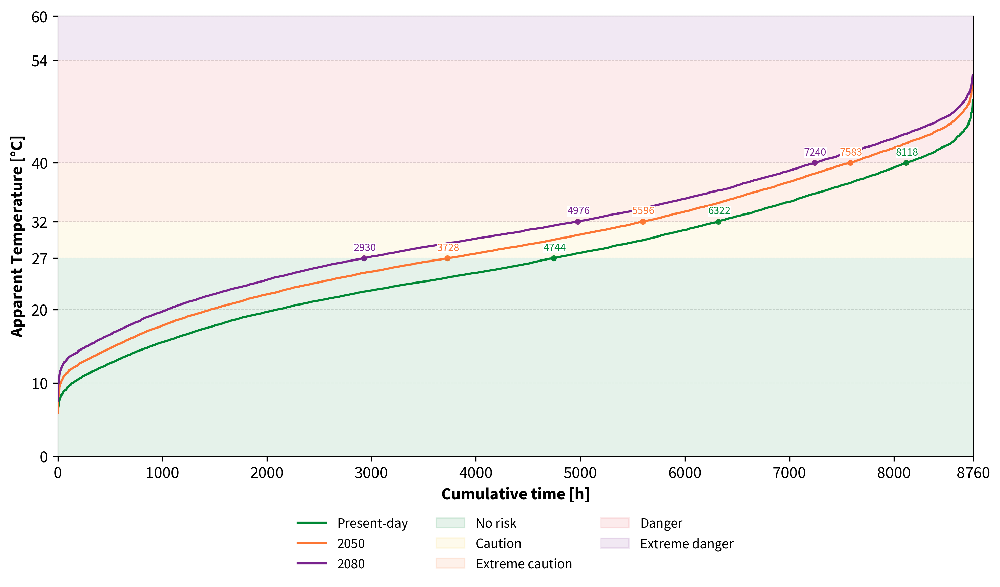

In [7]:
thresholds = [27, 32, 40, 54]

fig, ax1 = plt.subplots(figsize=(10, 6))
# ax2 = ax1.twiny()  # Create a secondary x-axis

df_resampled = {}
intersections = {}
x_values = {}
scenario_colors = {'present-day': dtu_colors['dtu_green'], '2050': dtu_colors['dtu_orange'], '2080': dtu_colors['dtu_purple']}
for i, scenario in enumerate(scenarios):
    # Resample the data to have hourly data and keep the mean and std for each hour
    df_resampled[scenario] = df[scenario].resample('H', on='Datetime').agg({'apparent_temperature': ['mean', 'std']})
    # Reset the index
    df_resampled[scenario] = df_resampled[scenario].reset_index()
    # Calculate the time difference between consecutive rows in hours
    df_resampled[scenario]['time_diff'] = (df_resampled[scenario]['Datetime'].diff().dt.total_seconds() / 3600).fillna(0)
    # Sort the values by apparent_temperature
    df_resampled[scenario] = df_resampled[scenario].sort_values(('apparent_temperature', 'mean'))
    # Calculate the cumulative sum of the time_diff column
    df_resampled[scenario]['cumsum'] = df_resampled[scenario]['time_diff'].cumsum()

    # Plot the cumulative curves
    ax1.plot(df_resampled[scenario]['cumsum'], df_resampled[scenario][('apparent_temperature', 'mean')], color=scenario_colors[scenario], label=scenario, linewidth=1.5)

    # # Shade the area between mean - std and mean + std
    # plt.fill_between(df_resampled[scenario]['cumsum'],
    #                  df_resampled[scenario][('apparent_temperature', 'mean')] - df_resampled[scenario][('apparent_temperature', 'std')],
    #                  df_resampled[scenario][('apparent_temperature', 'mean')] + df_resampled[scenario][('apparent_temperature', 'std')],
    #                  alpha=0.3)
    intersections[scenario] = []
    x_values[scenario] = []
    for threshold in thresholds:
        # plt.hlines(threshold, 0, 8760, color='k', linestyle='dashed', linewidth=0.3)

        # Get the intersection points between the cumulative curves and the thresholds
        crossings = df_resampled[scenario][df_resampled[scenario][('apparent_temperature', 'mean')] >= threshold]
        if not crossings.empty:
            intersections[scenario].append(crossings.iloc[0]['cumsum'])
            # Get the value of the intersection point on the x-axis
            value = crossings.iloc[0]['cumsum']
            # Plot the intersection points
            plt.scatter(intersections[scenario][-1], threshold, color=scenario_colors[scenario], marker='o', s=10)
            # Plot vertical lines from the intersection points to the x-axis
            # ax1.vlines(intersections[scenario][-1], 0, threshold, color=scenario_colors[scenario], linestyle='dashed', linewidth=0.5)
            # x_point
            x_point = intersections[scenario][-1]
            # y_point
            y_point = threshold
            x_values[scenario].append(value[0])
            text = str(round(value[0]))
            # Add a frame and background to the text
            ax = plt.gca()
            ax.text(x_point-100, y_point + 1, text, fontsize=8, color=scenario_colors[scenario], bbox=dict(facecolor='white', edgecolor='none', pad=0.1))

# Concat dict x_values in a numpy array
x_values = np.concatenate([x_values[scenario] for scenario in scenarios])

# Add fade colors between thresholds lines: the heat index, below 27 no risk, 27-32 caution, 32-40 extreme caution, 40-54 danger, above 54 extreme danger
ax1.axhspan(0, 27, facecolor=dtu_colors['dtu_green'], alpha=0.1)
ax1.axhspan(27, 32, facecolor=dtu_colors['dtu_yellow'], alpha=0.1)
ax1.axhspan(32, 40, facecolor=dtu_colors['dtu_orange'], alpha=0.1)
ax1.axhspan(40, 54, facecolor=dtu_colors['dtu_red'], alpha=0.1)
ax1.axhspan(54, 60, facecolor=dtu_colors['dtu_purple'], alpha=0.1)


ax1.set_xlabel('Cumulative time [h]')
ax1.set_xlim([0, 8760])
x_ticks = np.linspace(0, 8000, 9)
x_ticks = np.append(x_ticks, 8760)
ax1.set_xticks(x_ticks , [str(round(x)) for x in x_ticks])
ax1.set_ylabel('Apparent Temperature [°C]')
ax1.set_ylim([0, 60])
# Set the threshold labels on the y-axis
# Add 0 and 60 to the thresholds list
thresholds = [0]+ [10] + [20] + thresholds + [60]
ax1.set_yticks(thresholds, [str(threshold) for threshold in thresholds])
ax1.xaxis.grid(False)
# ax2.set_xlim(ax1.get_xlim())
# ax2.set_xticks(x_values, [str(round(8760 - x)) for x in x_values], rotation=90)
# ax2.set_xlabel('Cumulative time [h]')
# ax2.grid(False)

# Create legend handles and labels
green_line = mlines.Line2D([], [], color=dtu_colors['dtu_green'], label='Present-day')
orange_line = mlines.Line2D([], [], color=dtu_colors['dtu_orange'], label='2050')
purple_line = mlines.Line2D([], [], color=dtu_colors['dtu_purple'], label='2080')
# Add fade colors between thresholds lines: the heat index, below 27 no risk, 27-32 caution, 32-40 extreme caution, 40-54 danger, above 54 extreme danger
green_patch = mpatches.Patch(color=dtu_colors['dtu_green'], label='No risk', alpha=0.1)
yellow_patch = mpatches.Patch(color=dtu_colors['dtu_yellow'], label='Caution', alpha=0.1)
orange_patch = mpatches.Patch(color=dtu_colors['dtu_orange'], label='Extreme caution', alpha=0.1)
red_patch = mpatches.Patch(color=dtu_colors['dtu_red'], label='Danger', alpha=0.1)
purple_patch = mpatches.Patch(color=dtu_colors['dtu_purple'], label='Extreme danger', alpha=0.1)

# Create a single legend for all handles and labels
handles = [green_line, orange_line, purple_line, green_patch, yellow_patch, orange_patch, red_patch, purple_patch]
labels = [handle.get_label() for handle in handles]
# Add background to the legend and add subtitles for the legend
ax1.legend(handles=handles, labels=labels, loc='center', bbox_to_anchor=(0.5, -0.2), framealpha=1, frameon=False, fontsize=10, ncol=3)
plt.tight_layout()
# Save the figure
plt.savefig('../figures/simulations/heat_stress_cumulative.png', dpi=300)
plt.show()


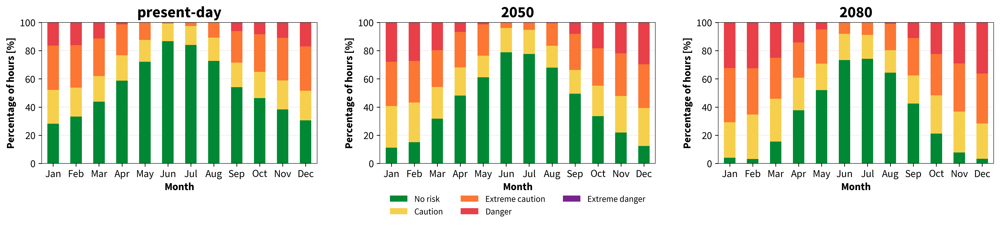

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a dataframe with the number of hours in each heat stress category for each scenario for each month and type_house
df_heat_stress = {}
for scenario in scenarios:
    # Calculate average apparent temperature for each month and type_house
    df_heat_stress[scenario] = df[scenario].resample('H', on='Datetime').mean()
    df_heat_stress[scenario] = df_heat_stress[scenario].reset_index()
    # Add heat stress category column to the dataframe based on the apparent temperature
    df_heat_stress[scenario]['heat_stress_category'] = pd.cut(df_heat_stress[scenario]['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])
    # Count the number of hours in each heat stress category for each scenario for each month and type_house
    # Keep only the month and heat_stress_category columns
    df_heat_stress[scenario] = df_heat_stress[scenario][['month', 'heat_stress_category']]
    # Create a count column with the number of hours in each heat stress category
    df_heat_stress[scenario]['count'] = 1
    df_heat_stress[scenario] = df_heat_stress[scenario].groupby(['month', 'heat_stress_category']).count()
    df_heat_stress[scenario] = df_heat_stress[scenario].reset_index()
    # Sort the values by month
    df_heat_stress[scenario] = df_heat_stress[scenario].sort_values('month')
    # Count the number of hours for each month
    df_heat_stress[scenario]['total_count_month'] = df_heat_stress[scenario].groupby('month')['count'].transform('sum')
    # Calculate the percentage of hours in each heat stress category for each month
    df_heat_stress[scenario]['count'] = df_heat_stress[scenario]['count'] / df_heat_stress[scenario]['total_count_month'] * 100


# Plot the results in 3 subplots for each scenario in stacked bar charts
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
axs = axs.ravel()

for i, scenario in enumerate(scenarios):
    # Plot the results in a stacked bar chart
    df_heat_stress[scenario].set_index('month').pivot(columns='heat_stress_category', values='count').plot.bar(stacked=True, ax=axs[i], color=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])

    axs[i].set_title(scenario)
    axs[i].set_xlabel('Month')
    axs[i].set_ylabel('Percentage of hours [%]')
    axs[i].set_ylim([0, 100])
    axs[i].grid(True)
    axs[i].xaxis.grid(False)
    axs[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct','Nov', 'Dec'], rotation=0)
    # Dont show the legend for the first and last subplot
    if i == 0 or i == 2:
        axs[i].legend().set_visible(False)
    
# Only show the legend for the middle subplot in the center of the figure in 5 columns below the figure
axs[1].legend(loc='center', bbox_to_anchor=(0.5, -0.3), framealpha=1, frameon=False, fontsize=10, ncol=3)
# Save the figure
plt.tight_layout()
plt.savefig('../figures/simulations/heat_stress_monthly.png', dpi=300)
plt.show()

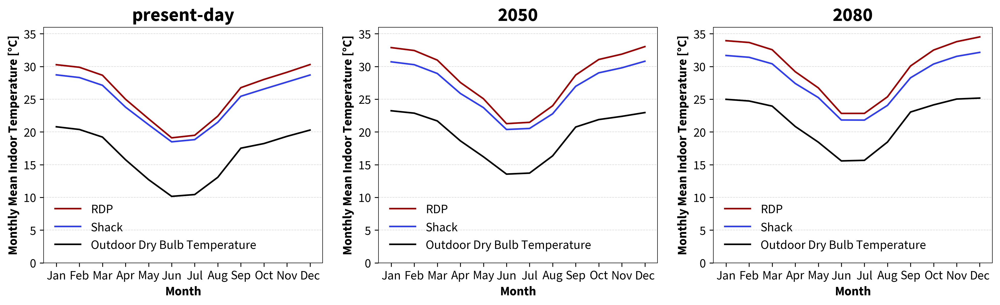

In [9]:
# Plot the results
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
axs = axs.ravel()

for i, scenario in enumerate(scenarios):
    # Replace 0 by RDP house and 1 by Shack house
    df_grouped[scenario]['type_house'] = df_grouped[scenario]['type_house'].replace(0, 'RDP')
    df_grouped[scenario]['type_house'] = df_grouped[scenario]['type_house'].replace(1, 'Shack')
    sns.lineplot(data=df_grouped[scenario], x='month', y='Indoor Mean Air Temperature', hue='type_house', ax=axs[i])
    sns.lineplot(data=df_grouped[scenario], x='month', y='Outdoor Dry Bulb Temperature', color='k', ax=axs[i], label='Outdoor Dry Bulb Temperature')
    axs[i].set_title(scenario)
    axs[i].set_ylabel('Monthly Mean Indoor Temperature [°C]')
    axs[i].set_xlabel('Month')
    axs[i].grid(True)
    axs[i].xaxis.grid(False)
    axs[i].set_ylim([0, 36])
    axs[i].set_xticks(np.arange(1, 13))
    axs[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct','Nov', 'Dec'])
    axs[i].legend()
# Save the figure
plt.savefig('../figures/simulations/indoor_mean_air_temperature_3 scenarios.png', dpi=300)
plt.show()

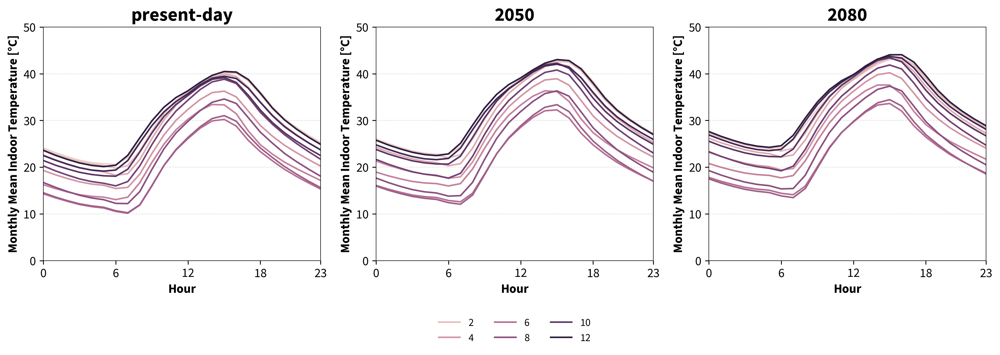

In [10]:
# Plot the results
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
axs = axs.ravel()

for i, scenario in enumerate(scenarios):
    # Make a hue for each month but not plotting lines but an area instead
    sns.lineplot(data=df_diurnal[scenario], x='hour', y='Indoor Mean Air Temperature', hue='month', ax=axs[i])
    axs[i].set_title(scenario)
    axs[i].set_ylabel('Monthly Mean Indoor Temperature [°C]')
    axs[i].set_xlabel('Hour')
    axs[i].grid(True)
    axs[i].xaxis.grid(False)
    axs[i].set_ylim([0, 50])
    hours = np.arange(0, 24, 6)
    hours = np.append(hours, 23)
    axs[i].set_xlim([0, 23])
    axs[i].set_xticks(hours)
    axs[i].legend().set_visible(False)

# Only show the legend for the middle subplot in the center of the figure in 5 columns below the figure
axs[1].legend(loc='center', bbox_to_anchor=(0.5, -0.3), framealpha=1, frameon=False, fontsize=10, ncol=3)


# Save the figure
plt.savefig('../figures/simulations/indoor_mean_air_temperature_diurnal_cycle_3 scenarios.png', dpi=300)
plt.show()

In [11]:
# Import data from machine learning cross validation done with GridSearchCV
df_rf_cv_results = pd.read_csv('../results/models/present-day_rf_ml_grid_search_results.csv')
df_bc_cv_results = pd.read_csv('../results/models/present-day_bc_ml_grid_search_results.csv')

In [12]:
import plotly.express as px
import kaleido as kaleido

# Plot the results for Random Forest

# Create a DataFrame with the results
df_rf_parallel_coord = df_rf_cv_results[['param_clf__max_depth', 'param_clf__min_samples_leaf', 'param_clf__min_samples_split', 'param_clf__n_estimators', 'mean_test_f1_score']]
# Rename the columns
df_rf_parallel_coord.columns = ['Max Depth', 'Min Samples Leaf', 'Min Samples Split', 'N Estimators', 'Mean Test F1 Score']

# Plot the results for having only one line in color for the best result
fig = px.parallel_coordinates(df_rf_parallel_coord, color='Mean Test F1 Score', color_continuous_scale=px.colors.sequential.Reds, range_color=[0.8, 1.0])

# Save the figure

# Show the plot
fig.show()

# Plot the results for Bagger Classifier
# Create a DataFrame with the results
df_bc_parallel_coord = df_bc_cv_results[['param_clf__bootstrap', 'param_clf__bootstrap_features', 'param_clf__max_features', 'param_clf__max_samples', 'param_clf__n_estimators', 'mean_test_f1_score']]

# Rename the columns
df_bc_parallel_coord.columns = ['Bootstrap', 'Bootstrap Features', 'Max Features', 'Max Samples', 'N Estimators', 'Mean Test F1 Score']
# Replace True by 1 and False by 0
df_bc_parallel_coord['Bootstrap'] = df_bc_parallel_coord['Bootstrap'].replace(True, 1)
df_bc_parallel_coord['Bootstrap'] = df_bc_parallel_coord['Bootstrap'].replace(False, 0)
df_bc_parallel_coord['Bootstrap Features'] = df_bc_parallel_coord['Bootstrap Features'].replace(True, 1)
df_bc_parallel_coord['Bootstrap Features'] = df_bc_parallel_coord['Bootstrap Features'].replace(False, 0)
# Plot the results for having only one line in color for the best result
fig = px.parallel_coordinates(df_bc_parallel_coord, color='Mean Test F1 Score', color_continuous_scale=px.colors.sequential.Reds, range_color=[0.8, 1.0])

# Show the plot
# Save the figure

fig.show()


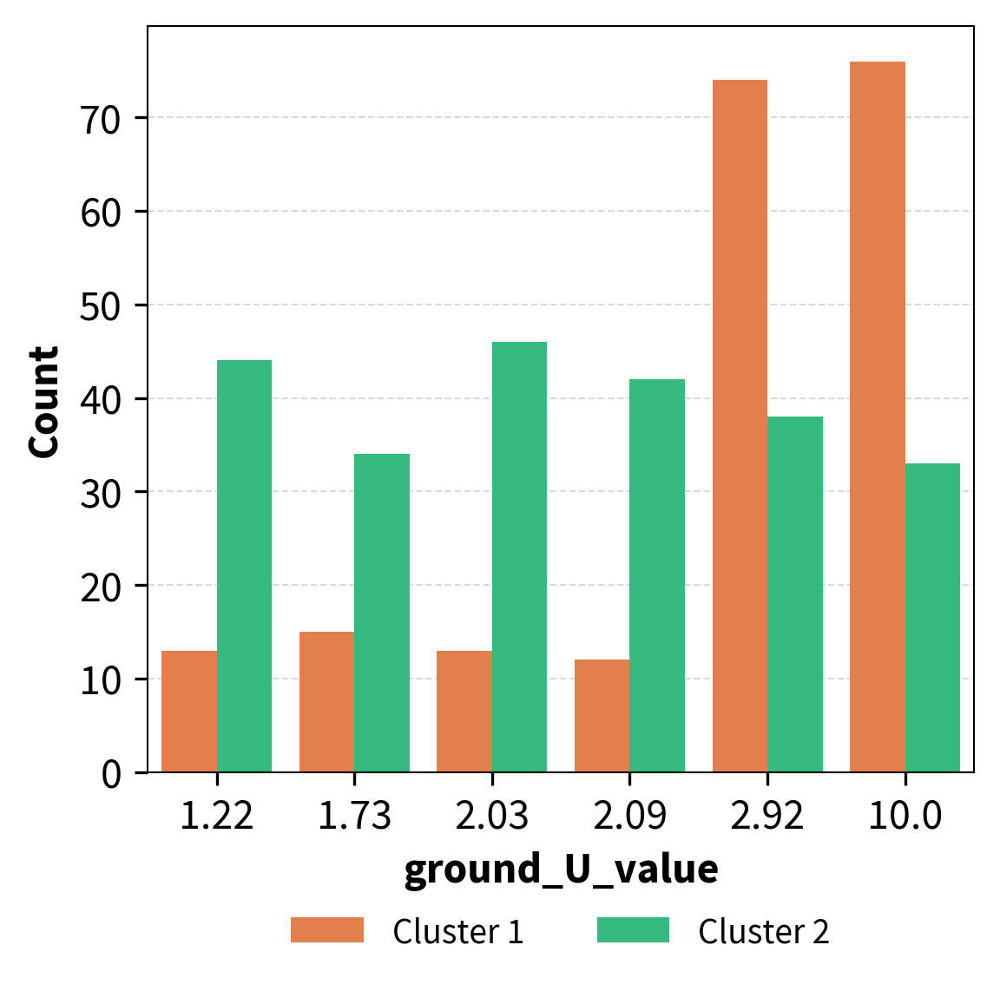

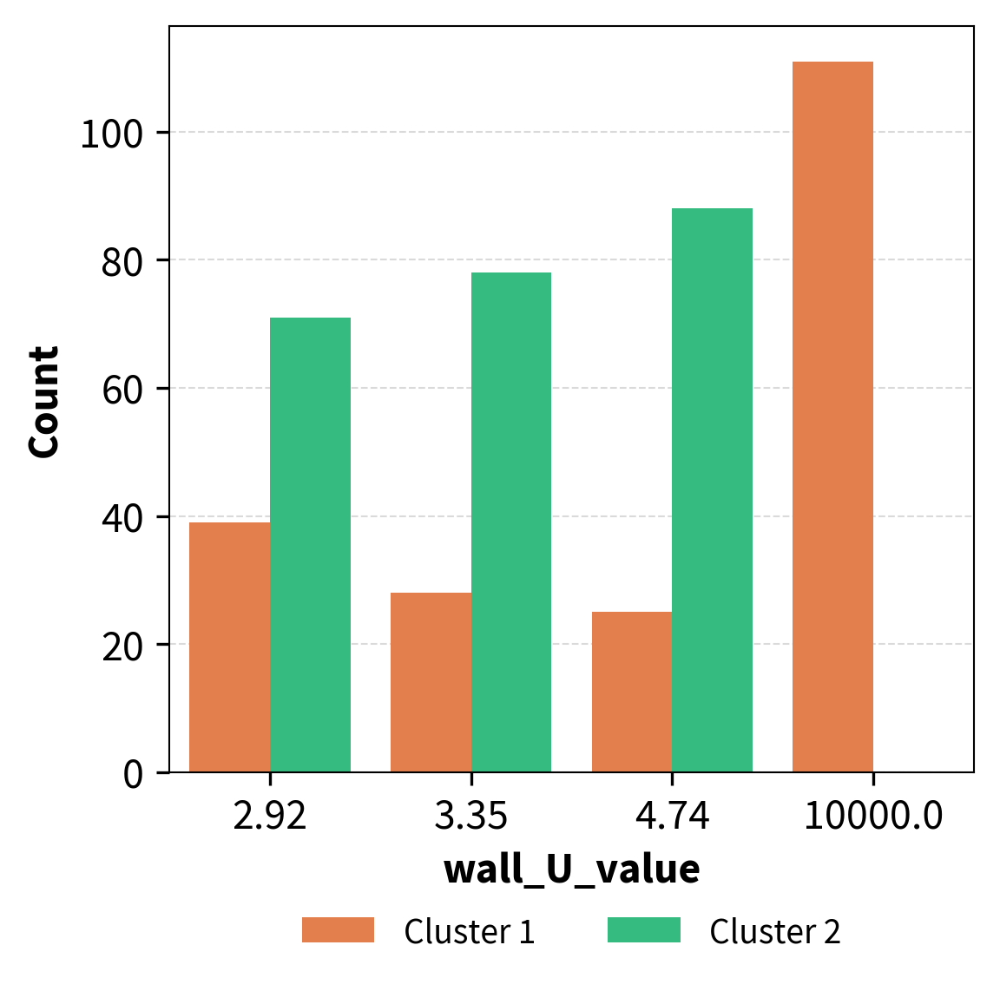

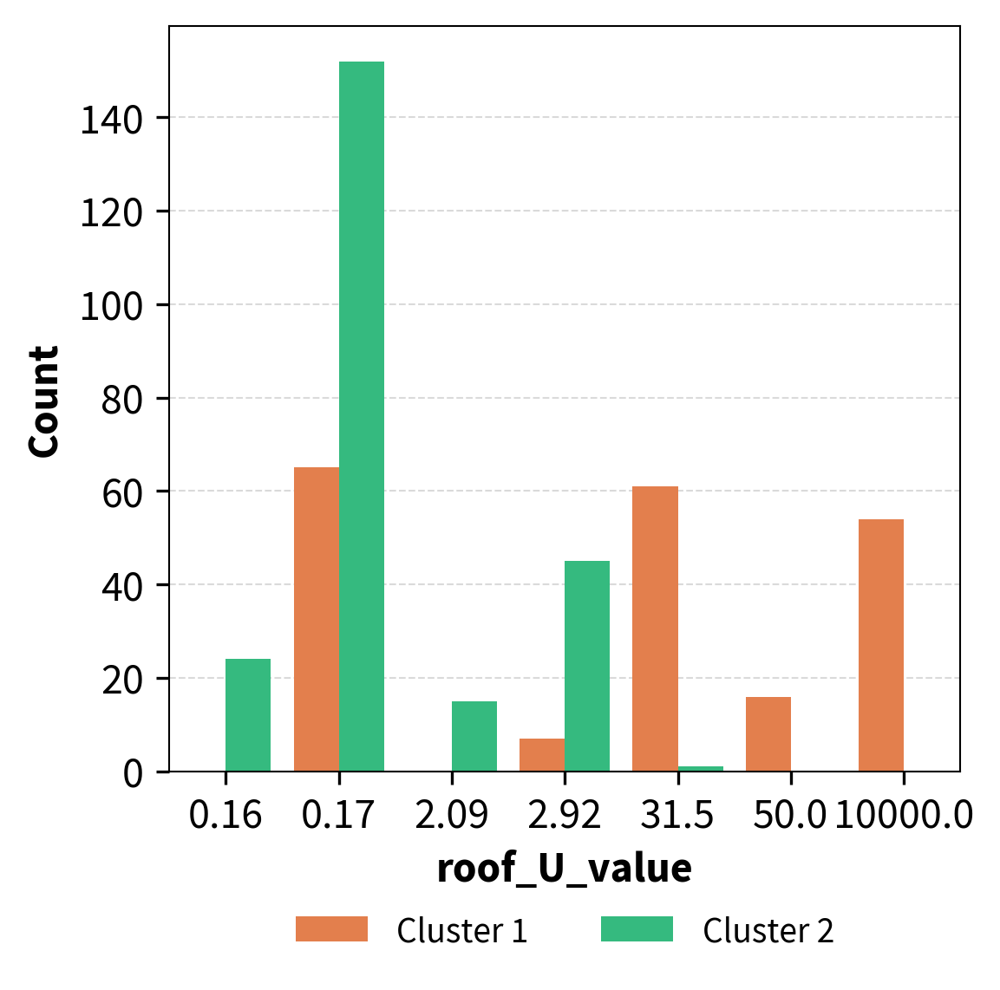

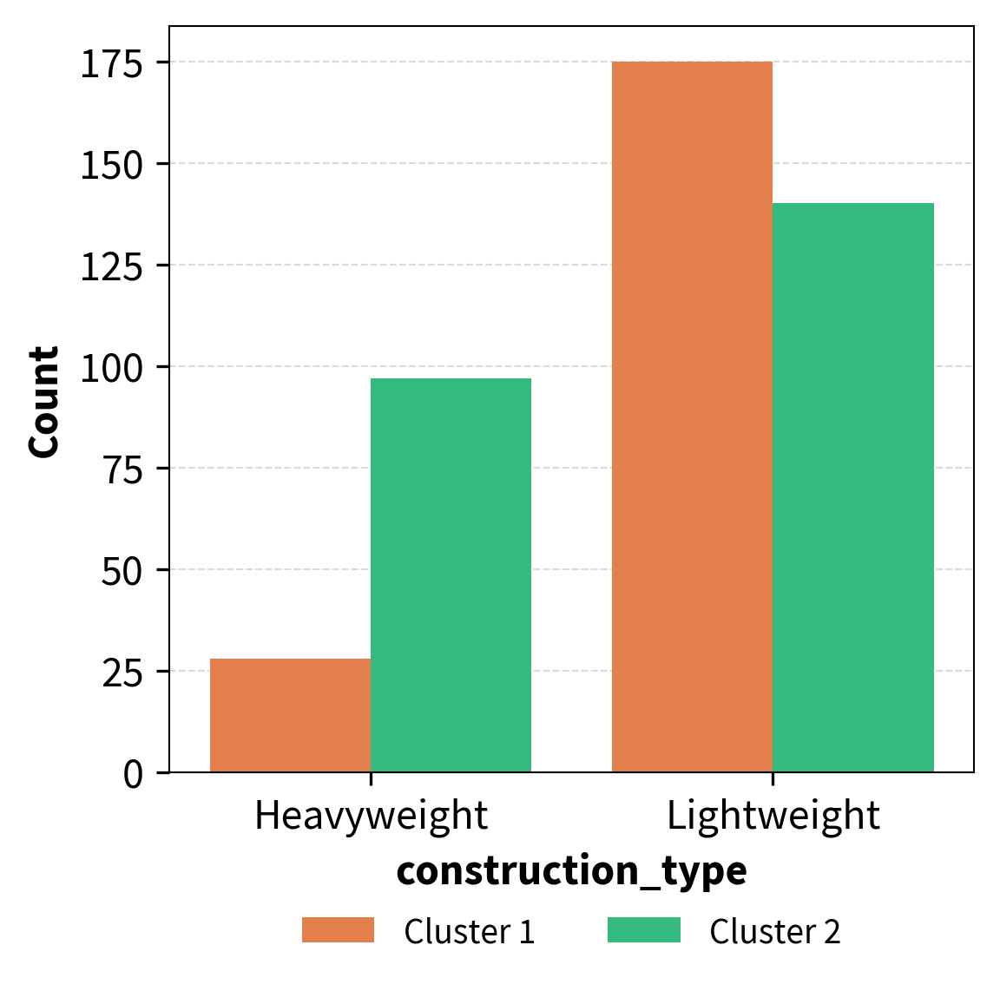

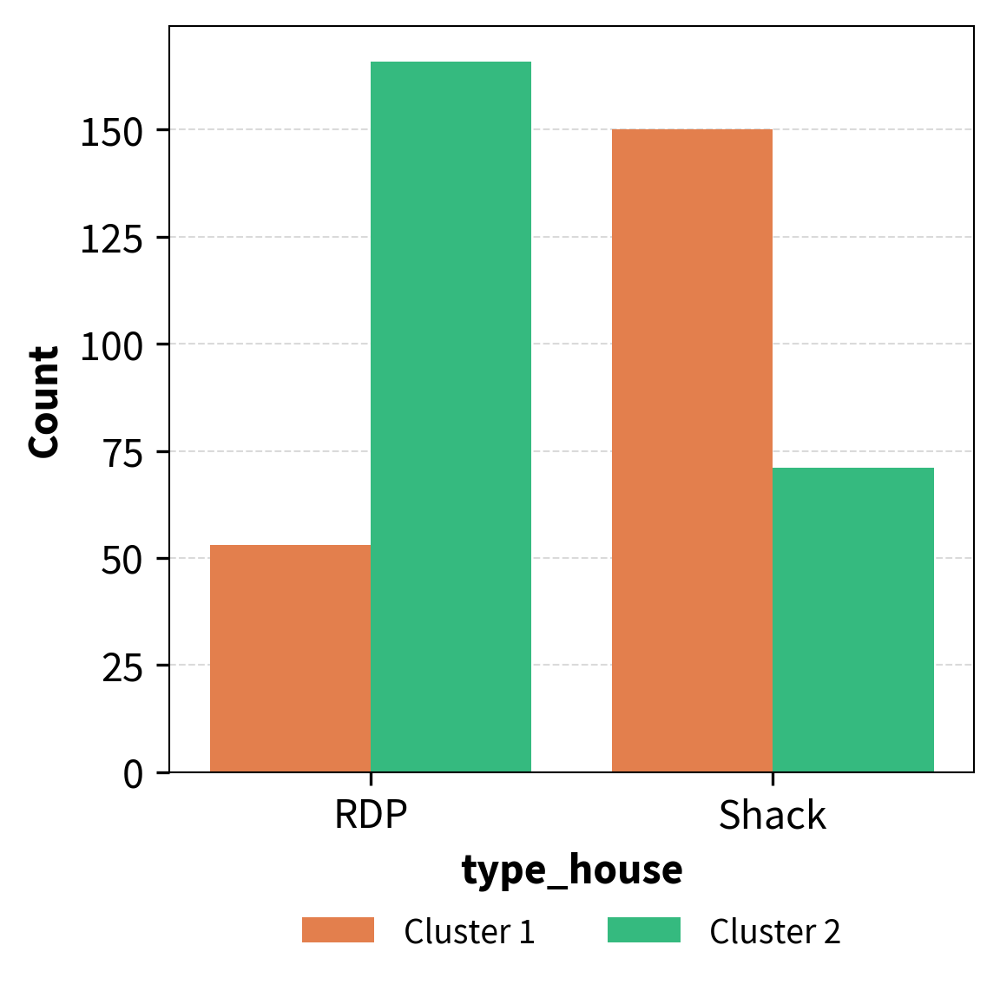

...

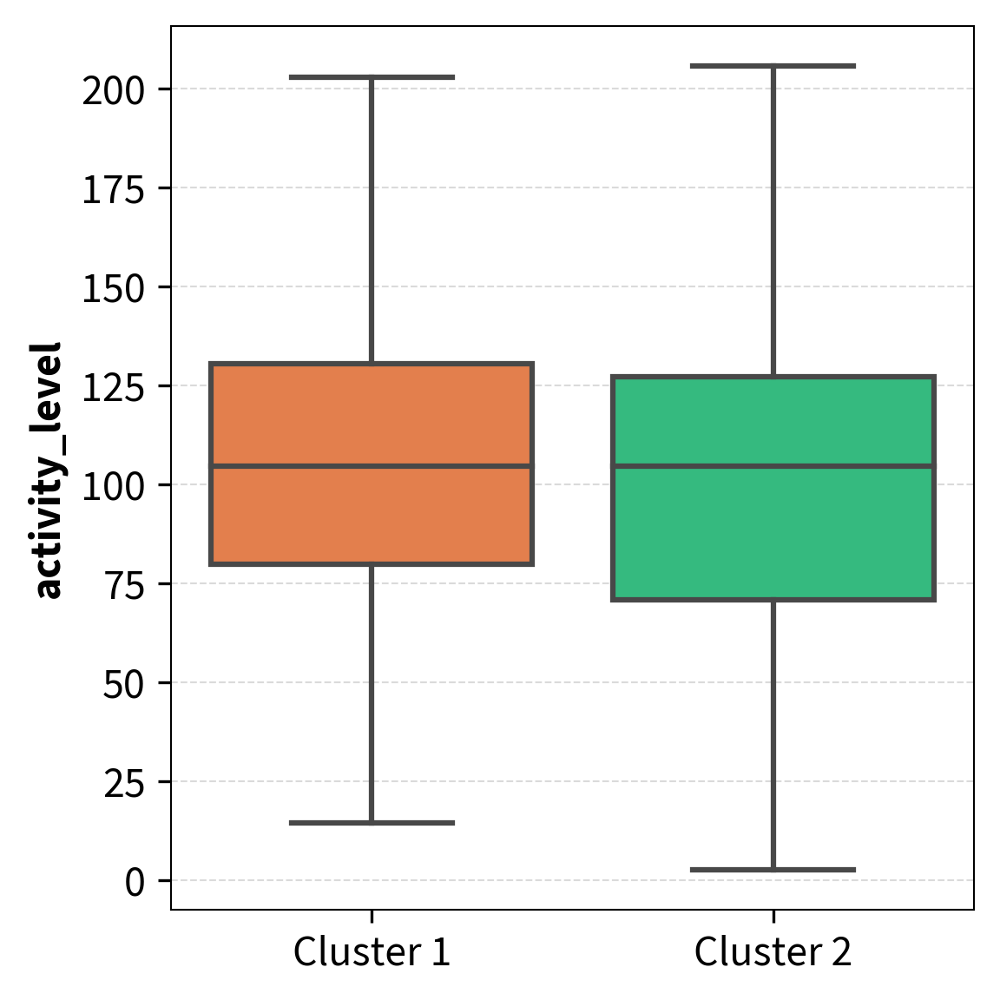

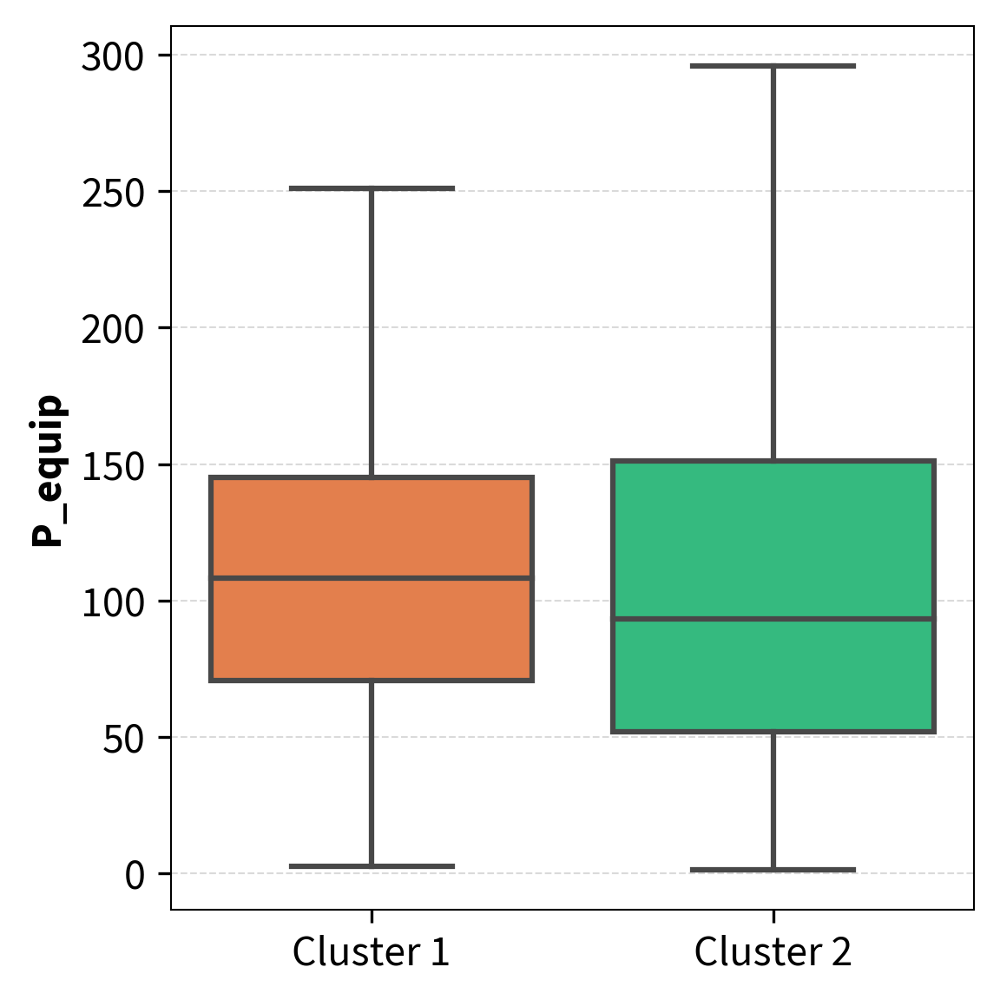

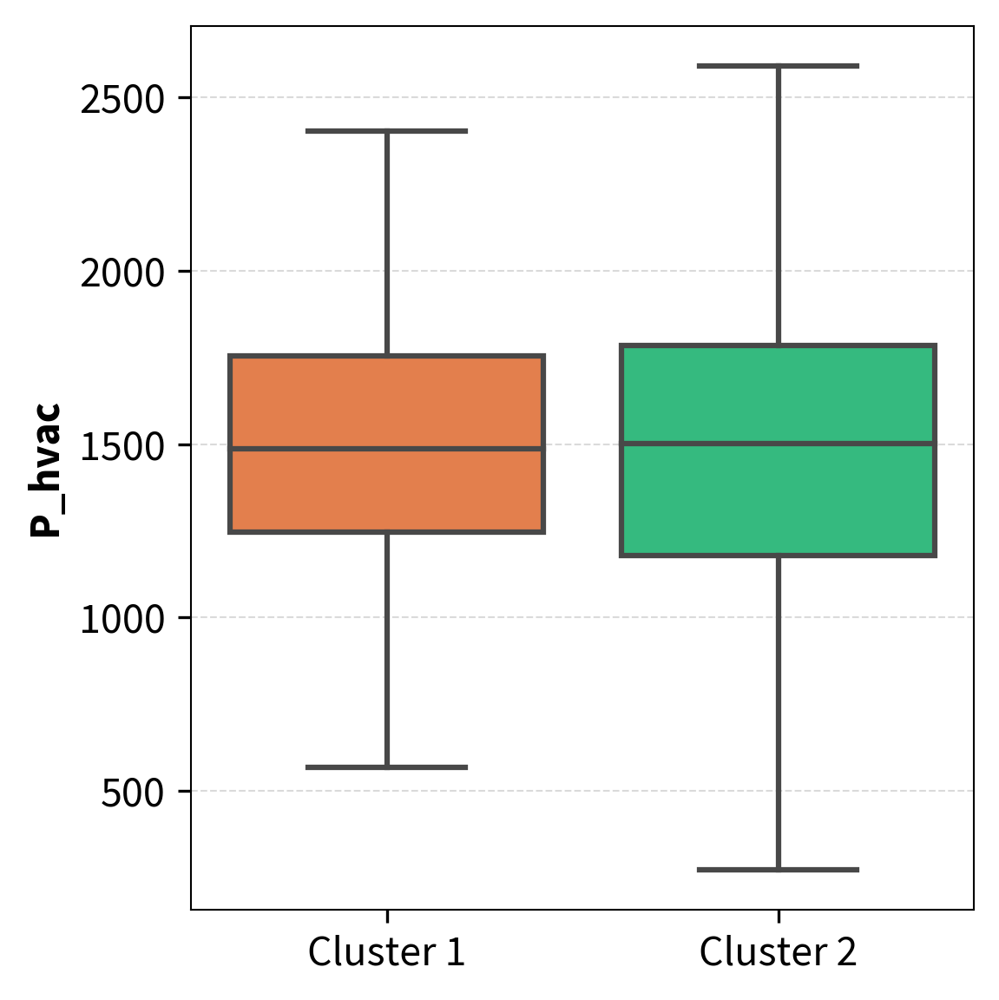

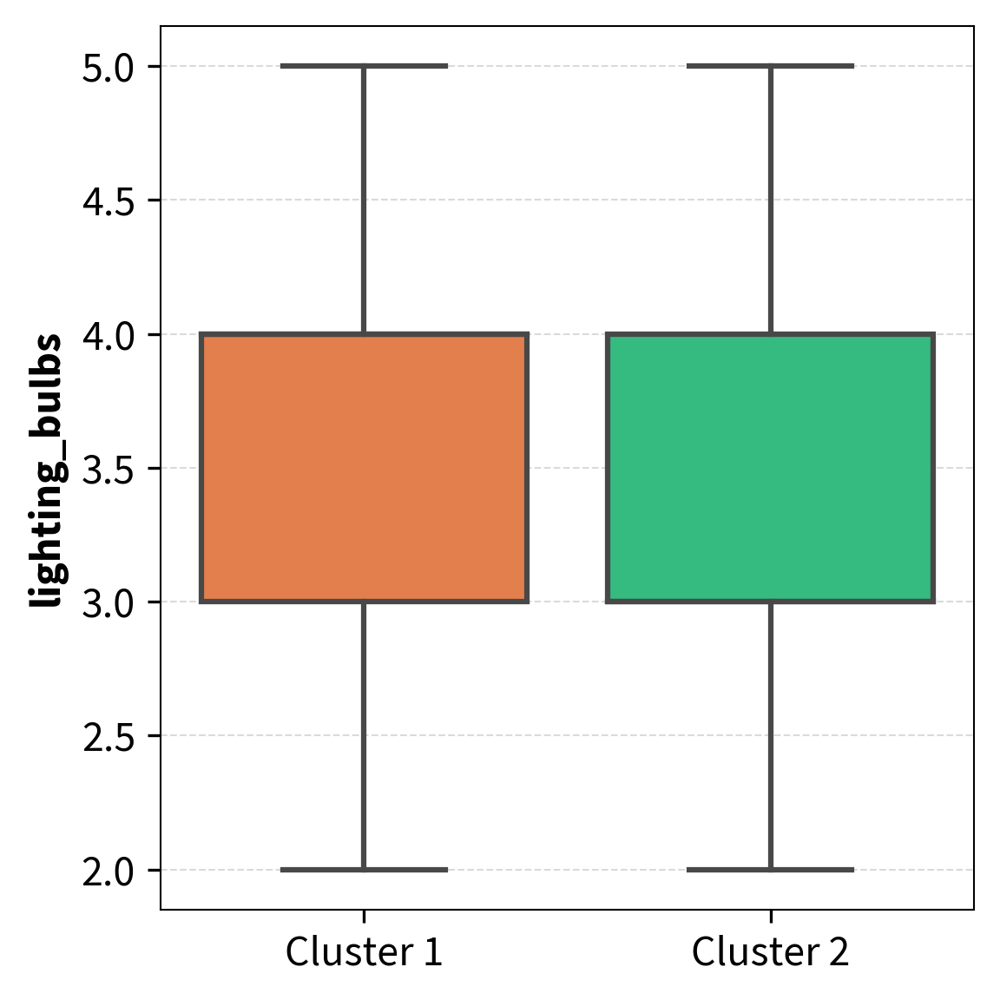

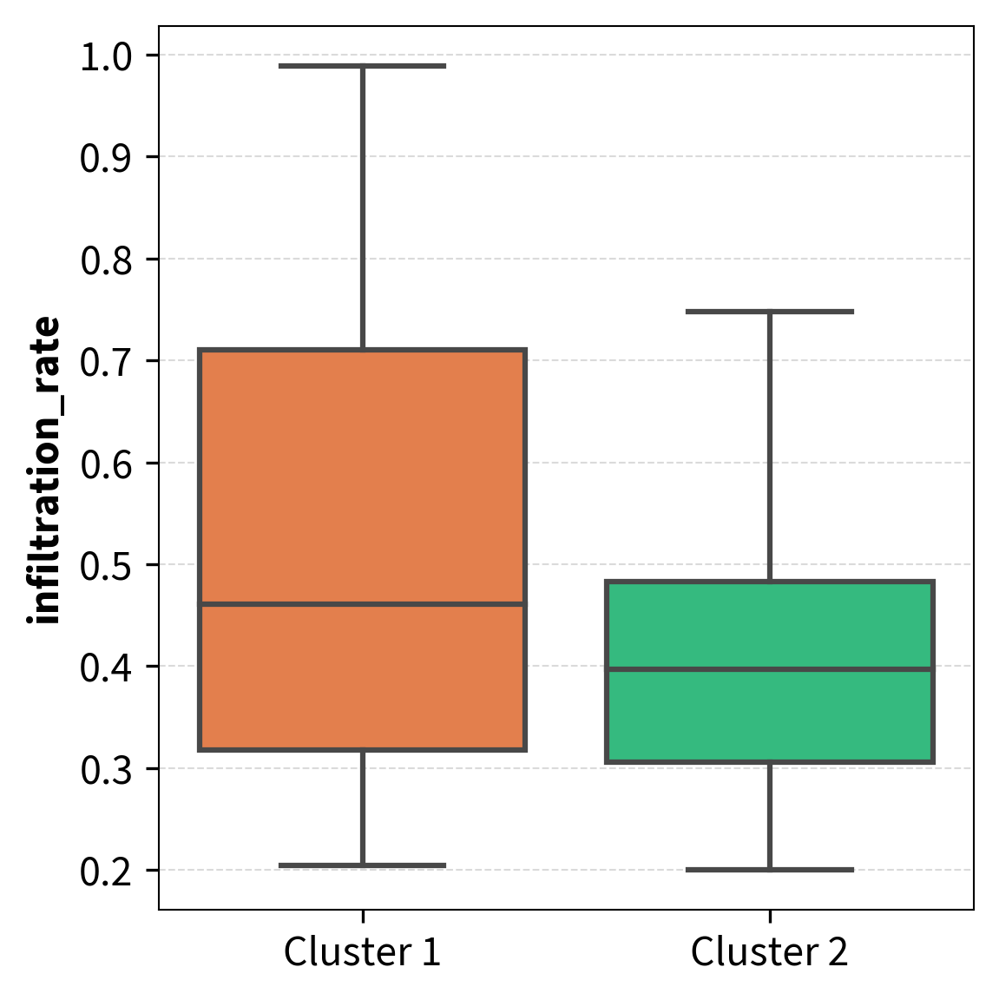

In [33]:
import plotly.express as px
# Import simulation inputs and labels for present-day
df_inputs = pd.read_csv('../results/simulations/present-day_inputs.csv')
df_labels = pd.read_csv('../results/simulations/present-day_cluster_labels.csv')

# Merge the inputs and labels dataframes onto the key column
df_inputs_labels = pd.merge(df_inputs, df_labels, on='key')

# Delete non useful columns
df_inputs_labels = df_inputs_labels.drop(['key', 'elec_gas', 'Unnamed: 0'], axis=1)
# Plot each column of the inputs dataframe against the cluster labels on a box plot for continuous variables and a bar plot for categorical variables using seaborn and matplotlib on separate
categorical_variables = ['ground_U_value', 'wall_U_value', 'roof_U_value', 'construction_type', 'type_house', 'ceiling_insulation', 'orientation']
# Round continuous variables to 2 decimals
df_inputs_labels = df_inputs_labels.round({'ground_U_value': 2, 'wall_U_value': 2, 'roof_U_value': 2})
# Replace categorical variables by their names
df_inputs_labels['construction_type'] = df_inputs_labels['construction_type'].replace(0, 'Lightweight')
df_inputs_labels['construction_type'] = df_inputs_labels['construction_type'].replace(1, 'Heavyweight')

df_inputs_labels['ceiling_insulation'] = df_inputs_labels['ceiling_insulation'].replace(0, 'Not insulated')
df_inputs_labels['ceiling_insulation'] = df_inputs_labels['ceiling_insulation'].replace(1, 'Insulated')

color_clusters = {0: dtu_colors['dtu_orange'], 1: dtu_colors['dtu_bright_green']}

for variable in categorical_variables:
    # Plot the results one bar plot for each cluster label and each categorical variable
    fig, ax = plt.subplots(figsize=(4, 4))
    sns.countplot(x=variable, hue='cluster', data=df_inputs_labels, ax=ax, palette=color_clusters)
    ax.set_xlabel(variable)
    ax.set_ylabel('Count')
    # ax.set_title('Cluster Labels vs ' + variable)
    # Add in the legend the cluster labels names but add one to the cluster labels to have cluster 1 and cluster 2 instead of cluster 0 and cluster 1
    handles, labels = ax.get_legend_handles_labels()
    labels = ['Cluster 1', 'Cluster 2']
    # Locate the legend below the plot
    ax.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, -0.15), framealpha=1, fontsize=10, ncol=2)
    # Save the figure
    plt.tight_layout()
    plt.savefig('../figures/simulations/present-day_cluster_labels_vs_' + variable + '.png', dpi=300)
    plt.show()

# For continuous variables
for variable in df_inputs_labels.columns:
    if variable not in categorical_variables:
        if variable != 'cluster':
            # Plot the results
            fig, ax = plt.subplots(figsize=(4, 4))
            sns.boxplot(x='cluster', y=variable, data=df_inputs_labels, ax=ax, showfliers=False, palette=color_clusters)
            # ax.set_xlabel('Cluster Labels')
            # Delete the x label
            ax.set_xlabel('')
            ax.set_ylabel(variable)
            ax.set_xticklabels(['Cluster 1', 'Cluster 2'])
            # ax.set_title('Cluster Labels vs ' + variable)
            plt.tight_layout()
            # Save the figure
            plt.savefig('../figures/simulations/present-day_cluster_labels_vs_' + variable + '.png', dpi=300)
            plt.show()


KeyError: 'RDP'

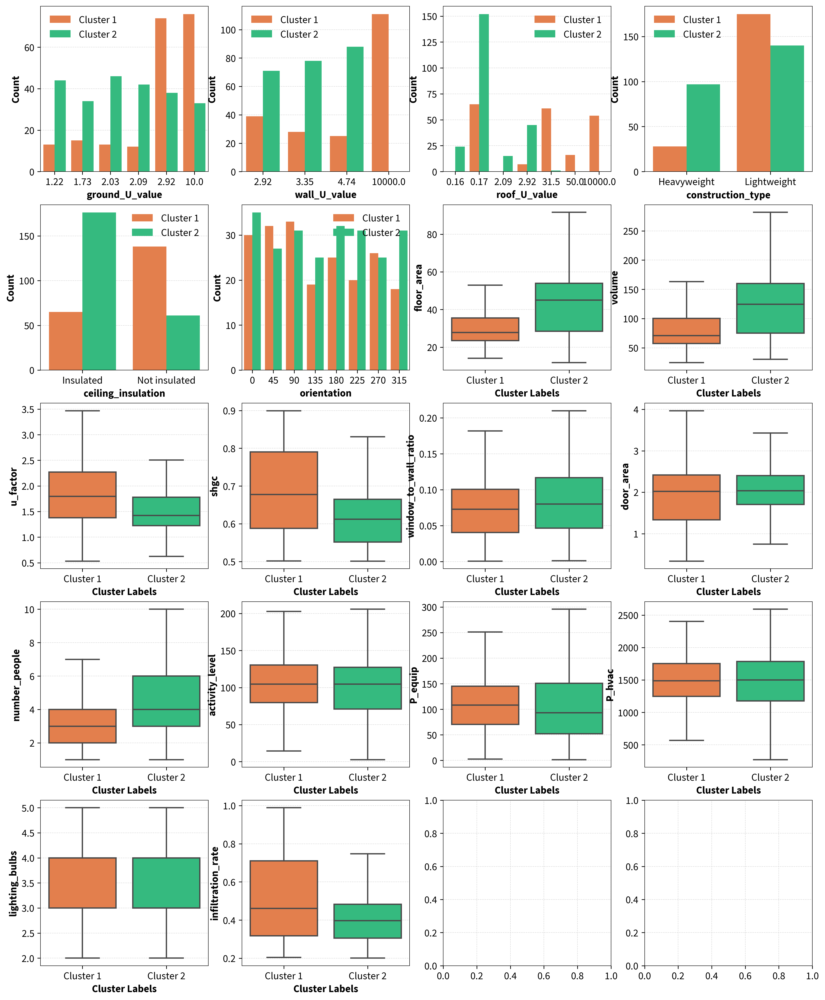

In [19]:
# Calculate the number of rows and columns
num_categorical = len(categorical_variables)
num_continuous = len(df_inputs_labels.columns) - len(categorical_variables) - 1
num_cols = 4
num_rows = (num_categorical + num_continuous - 1) // num_cols + 1

# Create a single figure with subfigures
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(4*num_cols, 4*num_rows))

# Plot for categorical variables
for i, variable in enumerate(categorical_variables):
    ax = axes[i // num_cols, i % num_cols]
    sns.countplot(x=variable, hue='cluster', data=df_inputs_labels, ax=ax, palette=color_clusters)
    ax.set_xlabel(variable)
    ax.set_ylabel('Count')
    handles, labels = ax.get_legend_handles_labels()
    labels = ['Cluster 1', 'Cluster 2']
    # ax.legend(handles, labels)

# Plot for continuous variables
continuous_variables = [variable for variable in df_inputs_labels.columns if variable not in categorical_variables and variable != 'cluster']
for i, variable in enumerate(continuous_variables):
    ax = axes[(num_categorical + i) // num_cols, (num_categorical + i) % num_cols]
    sns.boxplot(x='cluster', y=variable, data=df_inputs_labels, ax=ax, showfliers=False, palette=color_clusters)
    ax.set_xlabel('Cluster Labels')
    ax.set_ylabel(variable)
    ax.set_xticklabels(['Cluster 1', 'Cluster 2'])

# Remove empty subplots
if (num_categorical + num_continuous) % num_cols != 0:
    for i in range((num_categorical + num_continuous) % num_cols, num_cols):
        fig.delaxes(axes[-1, i])

# Adjust the layout of subplots
plt.tight_layout()

# Save the figure
plt.savefig('../figures/simulations/present-day_cluster_labels_vs_variables.png', dpi=300)
plt.show()

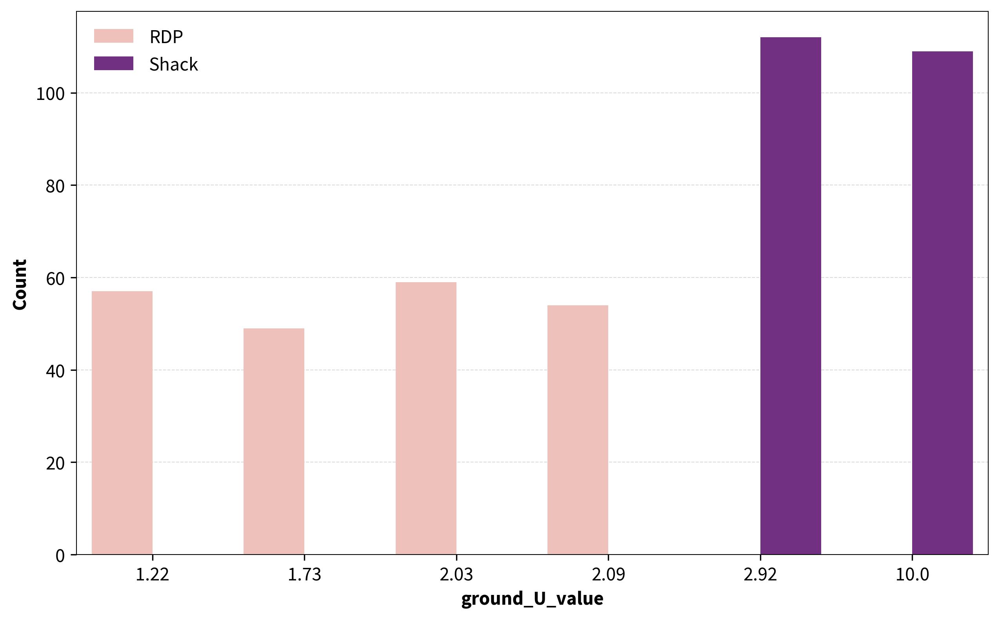

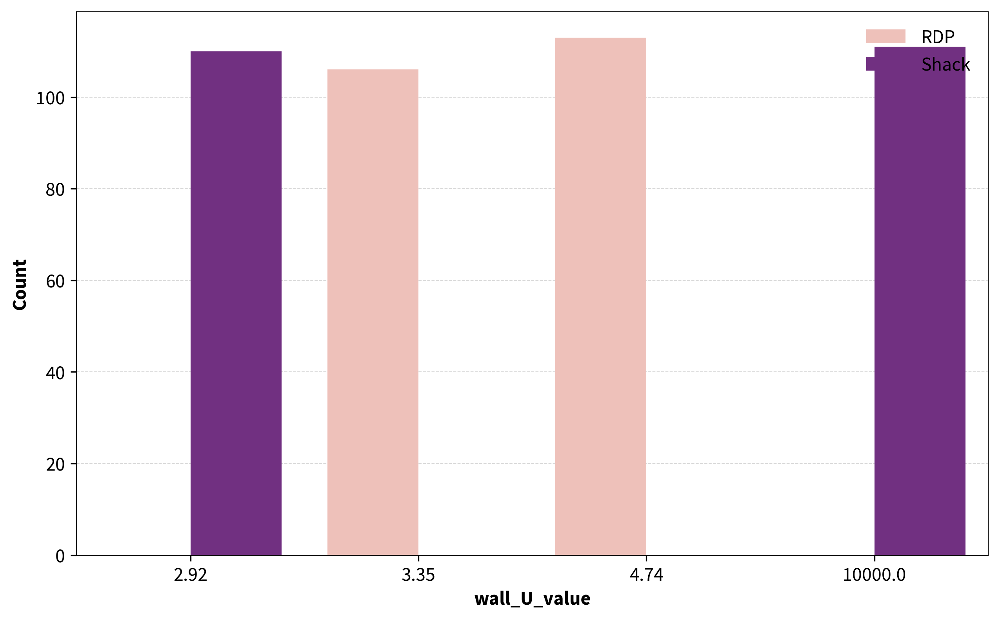

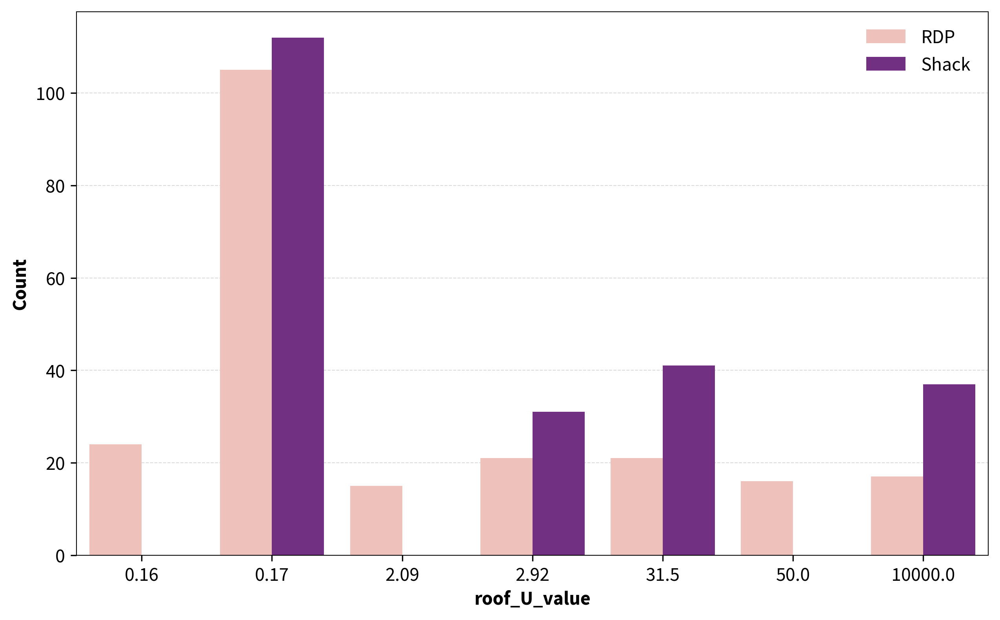

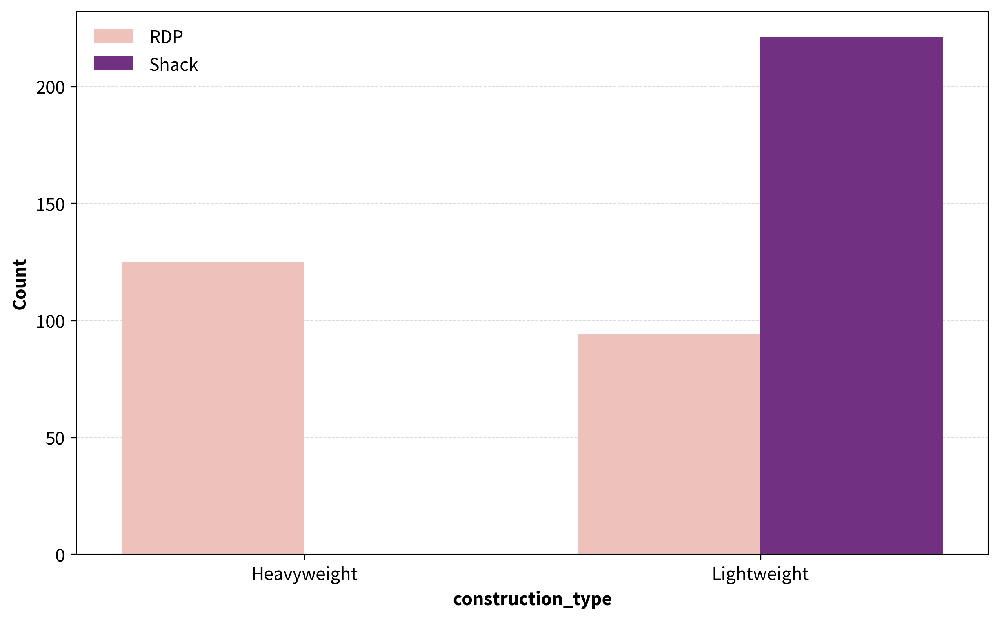

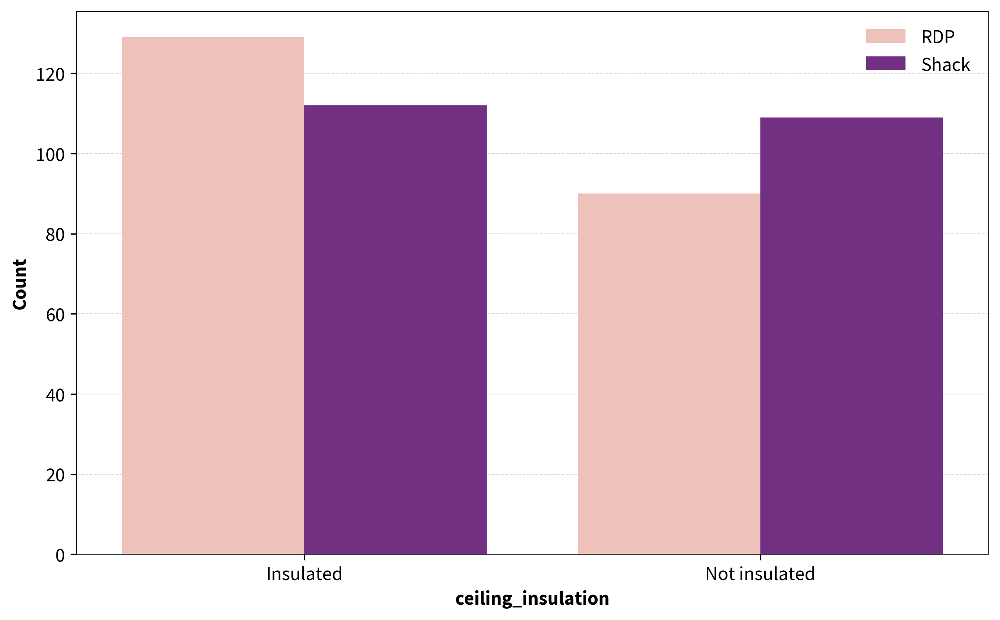

...

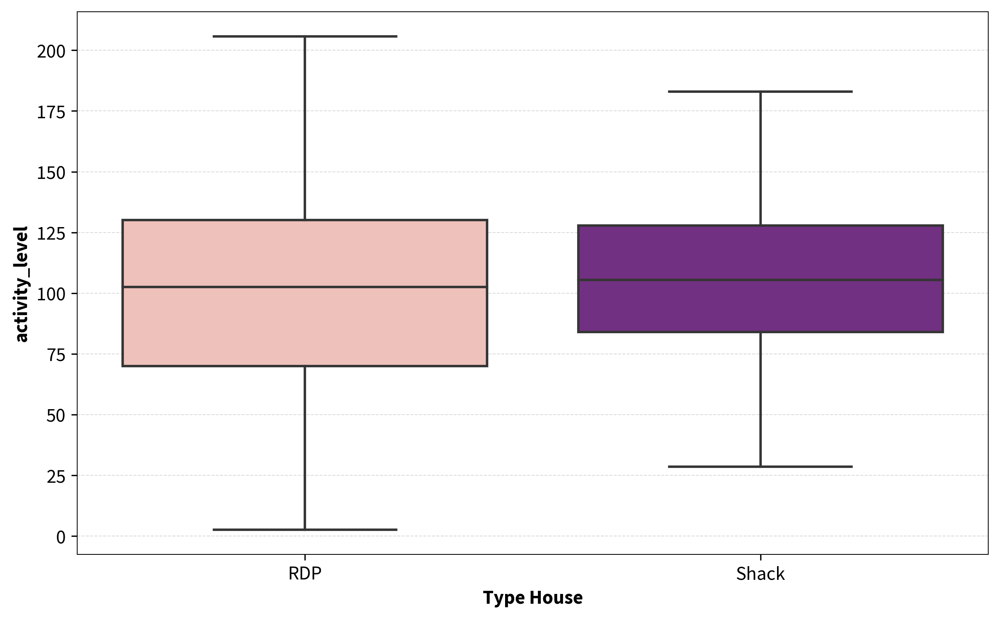

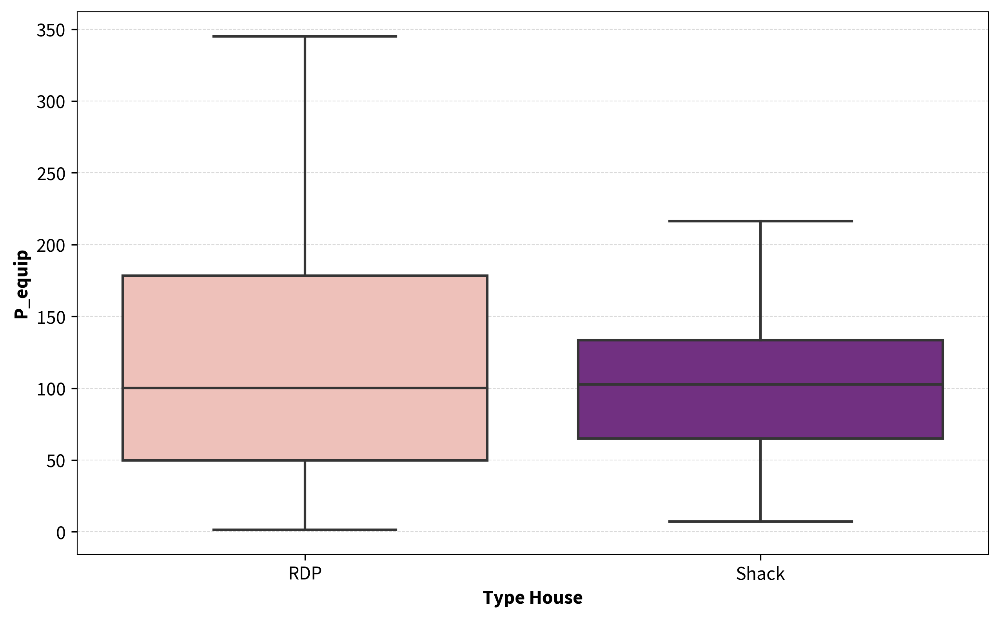

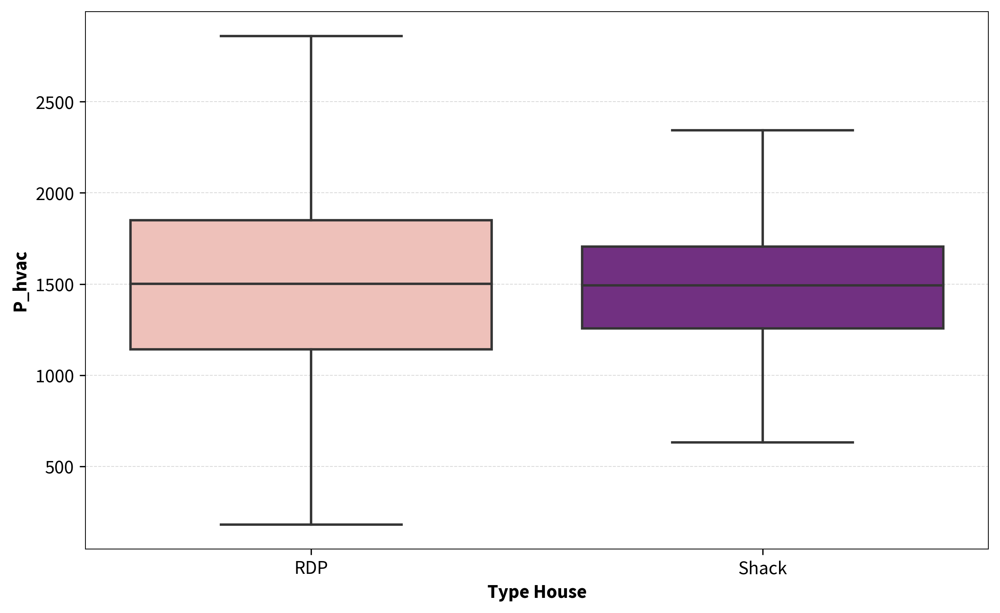

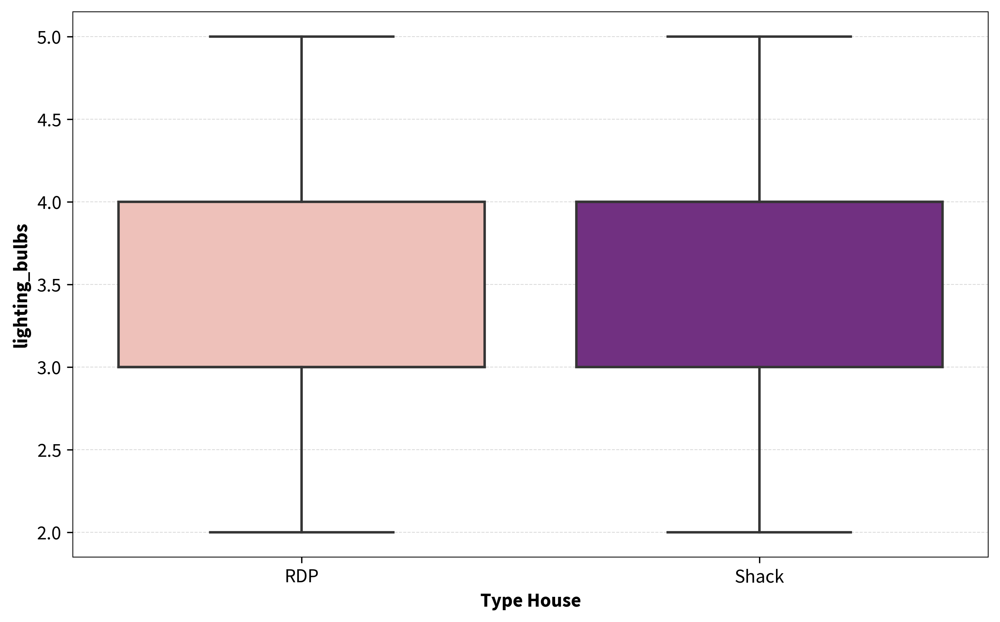

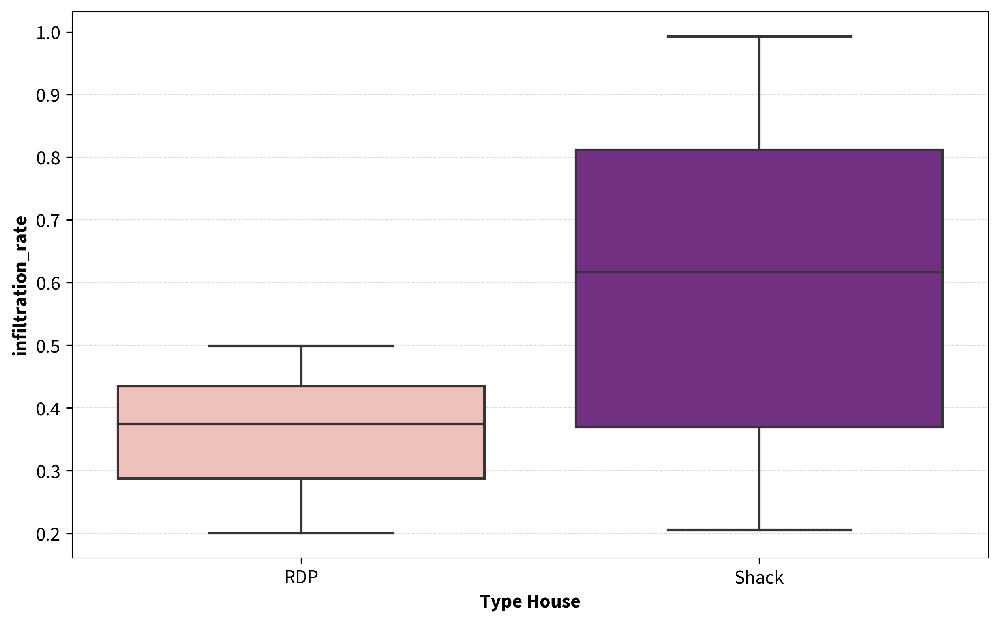

In [14]:
# Plot the same plots than with the cluster labels but against the type_house labels
# Import simulation inputs and labels for present-day
df_inputs = pd.read_csv('../results/simulations/present-day_inputs.csv')

# Delete non useful columns
df_inputs = df_inputs.drop(['key', 'elec_gas'], axis=1)
# Plot each column of the inputs dataframe against the cluster labels on a box plot for continuous variables and a bar plot for categorical variables using seaborn and matplotlib on separate
categorical_variables = ['ground_U_value', 'wall_U_value', 'roof_U_value', 'construction_type', 'ceiling_insulation', 'orientation']
# Round continuous variables to 2 decimals
df_inputs = df_inputs.round({'ground_U_value': 2, 'wall_U_value': 2, 'roof_U_value': 2})
# Replace categorical variables by their names
df_inputs['construction_type'] = df_inputs['construction_type'].replace(0, 'Lightweight')
df_inputs['construction_type'] = df_inputs['construction_type'].replace(1, 'Heavyweight')

df_inputs['ceiling_insulation'] = df_inputs['ceiling_insulation'].replace(0, 'Not insulated')
df_inputs['ceiling_insulation'] = df_inputs['ceiling_insulation'].replace(1, 'Insulated')

color_type_house = {'RDP': dtu_colors['dtu_pink'], 'Shack': dtu_colors['dtu_purple']}

for variable in categorical_variables:
    # Plot the results one bar plot for each cluster label and each categorical variable
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.countplot(x=variable, hue='type_house', data=df_inputs, ax=ax, palette=color_type_house)
    ax.set_xlabel(variable)
    ax.set_ylabel('Count')
    # ax.set_title('Cluster Labels vs ' + variable)
    # Add in the legend the cluster labels names but add one to the cluster labels to have cluster 1 and cluster 2 instead of cluster 0 and cluster 1
    handles, labels = ax.get_legend_handles_labels()
    labels = ['RDP', 'Shack']
    ax.legend(handles, labels)
    # Save the figure
    plt.savefig('../figures/simulations/present-day_type_house_vs_' + variable + '.png', dpi=300)
    plt.show()

# For continuous variables
for variable in df_inputs.columns:
    if variable not in categorical_variables:
        if variable != 'type_house':
            # Plot the results
            fig, ax = plt.subplots(figsize=(10, 6))
            sns.boxplot(x='type_house', y=variable, data=df_inputs, ax=ax, showfliers=False, palette=color_type_house)
            ax.set_xlabel('Type House')
            ax.set_ylabel(variable)
            ax.set_xticklabels(['RDP', 'Shack'])
            # ax.set_title('Cluster Labels vs ' + variable)
            # Save the figure
            plt.savefig('../figures/simulations/present-day_type_house_vs_' + variable + '.png', dpi=300)
            plt.show()


In [21]:

# Create a single figure with subfigures
fig, axes = plt.subplots(nrows=len(categorical_variables) + len(df_inputs.columns) - len(categorical_variables) - 1, ncols=4, figsize=(20, 6 * (len(categorical_variables) + len(df_inputs.columns) - len(categorical_variables) - 1)))

# Plot for categorical variables
for i, variable in enumerate(categorical_variables):
    ax = axes[i // 4, i % 4]
    sns.countplot(x=variable, hue='type_house', data=df_inputs, ax=ax, palette=color_type_house)
    ax.set_xlabel(variable)
    ax.set_ylabel('Count')
    handles, labels = ax.get_legend_handles_labels()
    labels = ['RDP', 'Shack']
    ax.legend(handles, labels)

# Plot for continuous variables
for i, variable in enumerate(df_inputs.columns):
    if variable not in categorical_variables and variable != 'type_house':
        ax = axes[(i + len(categorical_variables)) // 4, (i + len(categorical_variables)) % 4]
        sns.boxplot(x='type_house', y=variable, data=df_inputs, ax=ax, showfliers=False, palette=color_type_house)
        ax.set_xlabel('Type House')
        ax.set_ylabel(variable)
        ax.set_xticklabels(['RDP', 'Shack'])

# Remove empty subplots
if (len(categorical_variables) + len(df_inputs.columns) - len(categorical_variables) - 1) % 4 != 0:
    for i in range((len(categorical_variables) + len(df_inputs.columns) - len(categorical_variables) - 1) % 4, 4):
        fig.delaxes(axes[-1, i])

# Adjust the layout of subplots
plt.tight_layout()

# Save the figure
plt.savefig('../figures/simulations/present-day_type_house_vs_variables.png', dpi=300)
plt.show()

In [15]:
# Import inputs data for 2050 and 2080 and plot the statistics for each variable
# Import simulation inputs
df_inputs_2050 = pd.read_csv('../results/simulations/2050_inputs.csv')
df_inputs_2080 = pd.read_csv('../results/simulations/2080_inputs.csv')

# Delete non useful columns
df_inputs_2050 = df_inputs_2050.drop(['key', 'elec_gas'], axis=1)
df_inputs_2080 = df_inputs_2080.drop(['key', 'elec_gas'], axis=1)

# Plot each column of the inputs dataframe against the cluster labels on a box plot for continuous variables and a bar plot for categorical variables using seaborn and matplotlib on separate
categorical_variables = ['ground_U_value', 'wall_U_value', 'roof_U_value', 'construction_type', 'ceiling_insulation', 'orientation']
# Round continuous variables to 2 decimals
df_inputs_2050 = df_inputs_2050.round({'ground_U_value': 2, 'wall_U_value': 2, 'roof_U_value': 2})
df_inputs_2080 = df_inputs_2080.round({'ground_U_value': 2, 'wall_U_value': 2, 'roof_U_value': 2})
# Replace categorical variables by their names
df_inputs_2050['construction_type'] = df_inputs_2050['construction_type'].replace(0, 'Lightweight')
df_inputs_2050['construction_type'] = df_inputs_2050['construction_type'].replace(1, 'Heavyweight')

df_inputs_2050['ceiling_insulation'] = df_inputs_2050['ceiling_insulation'].replace(0, 'Not insulated')
df_inputs_2050['ceiling_insulation'] = df_inputs_2050['ceiling_insulation'].replace(1, 'Insulated')

df_inputs_2080['construction_type'] = df_inputs_2080['construction_type'].replace(0, 'Lightweight')
df_inputs_2080['construction_type'] = df_inputs_2080['construction_type'].replace(1, 'Heavyweight')

df_inputs_2080['ceiling_insulation'] = df_inputs_2080['ceiling_insulation'].replace(0, 'Not insulated')
df_inputs_2080['ceiling_insulation'] = df_inputs_2080['ceiling_insulation'].replace(1, 'Insulated')

# Print the statistics for continuous variables
for variable in df_inputs_2050.columns:
    if variable not in categorical_variables:
        if variable != 'type_house':
            print(variable)
            print('2050')
            print(df_inputs_2050[variable].describe())
            print('2080')
            print(df_inputs_2080[variable].describe())

# Print the count for categorical variables
for variable in categorical_variables:
    print(variable)
    print('2050')
    print(df_inputs_2050[variable].value_counts())
    print('2080')
    print(df_inputs_2080[variable].value_counts())


floor_area
2050
count    430.000000
mean      36.957863
std       15.026903
min       11.965392
25%       24.249200
50%       31.964934
75%       48.631364
max       80.146880
Name: floor_area, dtype: float64
2080
count    421.000000
mean      38.690069
std       14.981050
min        8.668354
25%       25.382715
50%       35.895358
75%       52.210585
max       73.487309
Name: floor_area, dtype: float64
volume
2050
count    430.000000
mean     104.022431
std       51.680277
min       21.815486
25%       59.372782
50%       92.559990
75%      142.590402
max      253.724923
Name: volume, dtype: float64
2080
count    421.000000
mean     110.353696
std       54.141325
min       14.568429
25%       61.080504
50%      101.801955
75%      153.531278
max      265.002460
Name: volume, dtype: float64
u_factor
2050
count    430.000000
mean       1.649129
std        0.553097
min        0.511351
25%        1.229384
50%        1.538106
75%        1.991480
max        3.390062
Name: u_factor, dtype: f

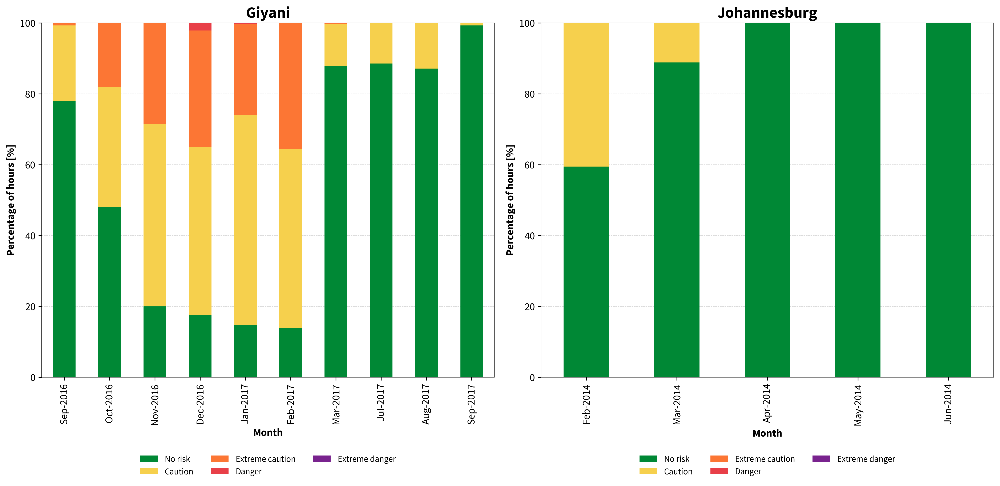

Giyani
heat_stress_category  No risk  Caution  Extreme caution  Danger  \
month                                                             
Aug-2017                  324       48                0       0   
Dec-2016                   65      177              122       8   
Feb-2017                   47      169              120       0   
Jan-2017                   55      220               96       1   
Jul-2017                  308       40                0       0   
Mar-2017                  211       28                1       0   
Nov-2016                   72      185              103       0   
Oct-2016                  179      126               67       0   
Sep-2016                  215       59                2       0   
Sep-2017                  137        1                0       0   

heat_stress_category  Extreme danger  
month                                 
Aug-2017                           0  
Dec-2016                           0  
Feb-2017                        

In [47]:
from pythermalcomfort.models import at
import pandas as pd
import matplotlib.pyplot as plt

# Import data from measurements Johannesburg and Giyani
df_giyani_summer = pd.read_csv('../database/cleaned/giyani_summer_concatenated.csv')
df_giyani_winter = pd.read_csv('../database/cleaned/giyani_winter_concatenated.csv')
df_giyani = pd.concat([df_giyani_summer, df_giyani_winter])
df_johannesburg = pd.read_csv('../database/cleaned/johannesburg_concatenated.csv')

# Calculate the apparent temperature for Giyani and Johannesburg
df_giyani = df_giyani[df_giyani['Indoor Air Relative Humidity'] != 0]
df_giyani['apparent_temperature'] = df_giyani.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)
df_johannesburg['apparent_temperature'] = df_johannesburg.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)

# Convert the Datetime column to datetime format
df_giyani['Datetime'] = pd.to_datetime(df_giyani['Datetime'])
df_johannesburg['Datetime'] = pd.to_datetime(df_johannesburg['Datetime'])

# Calculate the mean per hour for each location
df_giyani = df_giyani.resample('H', on='Datetime').mean()
df_johannesburg = df_johannesburg.resample('H', on='Datetime').mean()

# Datetime column is now the index so reset it
df_giyani = df_giyani.reset_index()
df_johannesburg = df_johannesburg.reset_index()

# Delete nan
df_giyani = df_giyani.dropna()
df_johannesburg = df_johannesburg.dropna()

# Add Heat Stress Category column to the dataframe based on the apparent temperature
df_giyani['heat_stress_category'] = pd.cut(df_giyani['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])
df_johannesburg['heat_stress_category'] = pd.cut(df_johannesburg['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])

# Change datetime format to month-YYYY
df_giyani['month'] = df_giyani['Datetime'].dt.strftime('%b-%Y')
df_johannesburg['month'] = df_johannesburg['Datetime'].dt.strftime('%b-%Y')

# Count the number of hours in each heat stress category for each month and location
df_giyani_counts = df_giyani.groupby(['month', 'heat_stress_category']).size().unstack(fill_value=0)
df_johannesburg_counts = df_johannesburg.groupby(['month', 'heat_stress_category']).size().unstack(fill_value=0)

# Calculate the percentage of hours in each heat stress category for each month
df_giyani_perc = df_giyani_counts.div(df_giyani_counts.sum(axis=1), axis=0) * 100
df_johannesburg_perc = df_johannesburg_counts.div(df_johannesburg_counts.sum(axis=1), axis=0) * 100

# Sort the DataFrame by month in chronological order
df_giyani_perc = df_giyani_perc.sort_values('month', key=lambda x: pd.to_datetime(x, format='%b-%Y'))
df_johannesburg_perc = df_johannesburg_perc.sort_values('month', key=lambda x: pd.to_datetime(x, format='%b-%Y'))

# Plot the results in stacked bar charts for each location
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs = axs.ravel()

# Plot the results for Giyani
df_giyani_perc.plot.bar(stacked=True, ax=axs[0], color=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[0].set_title('Giyani')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Percentage of hours [%]')
axs[0].set_ylim([0, 100])
axs[0].grid(True)
axs[0].xaxis.grid(False)
axs[0].legend(loc='center', bbox_to_anchor=(0.5, -0.25), framealpha=1, frameon=False, fontsize=10, ncol=3)

# Plot the results for Johannesburg
df_johannesburg_perc.plot.bar(stacked=True, ax=axs[1], color=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[1].set_title('Johannesburg')
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Percentage of hours [%]')
axs[1].set_ylim([0, 100])
axs[1].grid(True)
axs[1].xaxis.grid(False)
axs[1].legend(loc='center', bbox_to_anchor=(0.5, -0.25), framealpha=1, frameon=False, fontsize=10, ncol=3)

# Save the figure
plt.tight_layout()
plt.savefig('../figures/measurements/heat_stress_monthly_giyani_johannesburg.png', dpi=300)
plt.show()

# Print the number of hours in each heat stress category for each month and location for Giyani and Johannesburg
print('Giyani')
print(df_giyani_counts)

print('Johannesburg')
print(df_johannesburg_counts)

TypeError: Horizontal orientation requires numeric `x` variable.

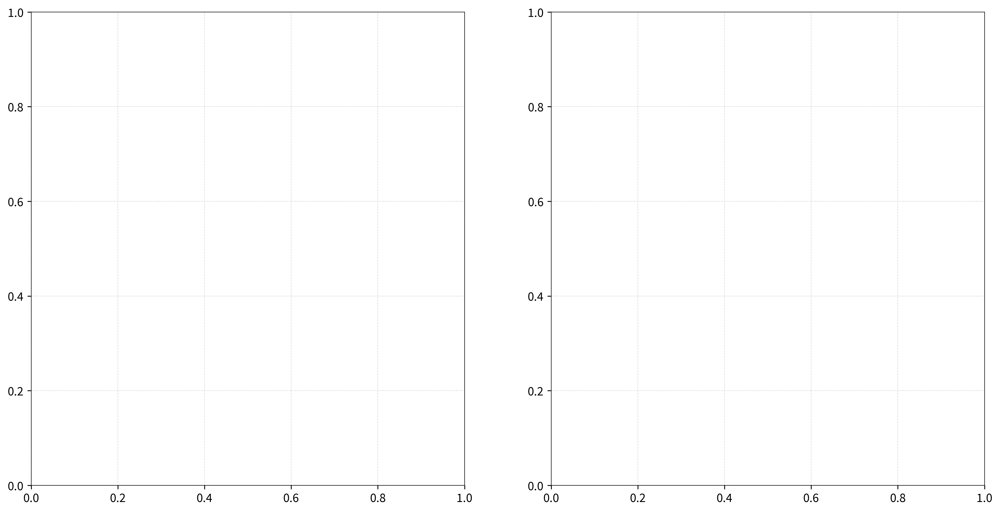

In [75]:
# Import data from measurements Johannesburg and Giyani
df_giyani_summer = pd.read_csv('../database/cleaned/giyani_summer_concatenated.csv')
df_giyani_winter = pd.read_csv('../database/cleaned/giyani_winter_concatenated.csv')
df_giyani = pd.concat([df_giyani_summer, df_giyani_winter])
df_johannesburg = pd.read_csv('../database/cleaned/johannesburg_concatenated.csv')

# Calculate the apparent temperature for Giyani and Johannesburg
df_giyani = df_giyani[df_giyani['Indoor Air Relative Humidity'] != 0]
df_giyani['apparent_temperature'] = df_giyani.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)
df_johannesburg['apparent_temperature'] = df_johannesburg.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)

# Convert the Datetime column to datetime format
df_giyani['Datetime'] = pd.to_datetime(df_giyani['Datetime'])
df_johannesburg['Datetime'] = pd.to_datetime(df_johannesburg['Datetime'])

# Calculate the heat stress category for each hour
df_giyani['heat_stress_category'] = pd.cut(df_giyani['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])
df_johannesburg['heat_stress_category'] = pd.cut(df_johannesburg['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])

# Calculate per key the number of hours in each heat stress category
df_giyani = df_giyani.groupby('key').apply(lambda x: x.groupby('heat_stress_category').size()).unstack(fill_value=0)
df_johannesburg = df_johannesburg.groupby('key').apply(lambda x: x.groupby('heat_stress_category').size()).unstack(fill_value=0)

# Reset index
df_giyani = df_giyani.reset_index()
df_johannesburg = df_johannesburg.reset_index()

# Plot box plot for on two subplots for each location of the number of hours per heat stress category
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs = axs.ravel()

labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger']

# Plot box plot per each heat stress category for Giyani 
sns.boxplot(x=labels,data=df_giyani[['heat_stress_category', 0]], ax=axs[0], palette=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[0].set_title('Giyani')
axs[0].set_xlabel('Heat Stress Category')
axs[0].set_ylabel('Number of hours')

# Plot box plot per each heat stress category for Johannesburg
sns.boxplot(x = labels, data=df_johannesburg[['heat_stress_category', 0]], ax=axs[1], palette=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[1].set_title('Johannesburg')
axs[1].set_xlabel('Heat Stress Category')
axs[1].set_ylabel('Number of hours')

# Save the figure


plt.tight_layout()
plt.savefig('../figures/measurements/heat_stress_boxplot_giyani_johannesburg.png', dpi=300)
plt.show()


In [ ]:
df_giyani[['heat_stress_category', 0]]

KeyError: "None of [Index(['heat_stress_category', 0], dtype='object', name='heat_stress_category')] are in the [columns]"

Index(['key', 'No risk', 'Caution', 'Extreme caution', 'Danger',
       'Extreme danger'],
      dtype='object', name='heat_stress_category')
Index(['key', 'No risk', 'Caution', 'Extreme caution', 'Danger',
       'Extreme danger'],
      dtype='object', name='heat_stress_category')


ValueError: Could not interpret input 'heat_stress_category'

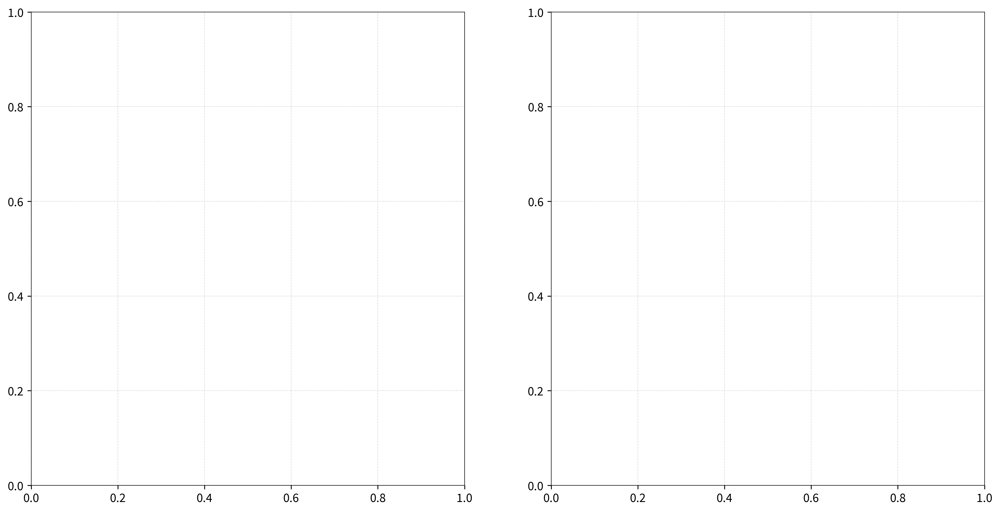

In [73]:
from pythermalcomfort.models import at
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Import data from measurements Johannesburg and Giyani
df_giyani_summer = pd.read_csv('../database/cleaned/giyani_summer_concatenated.csv')
df_giyani_winter = pd.read_csv('../database/cleaned/giyani_winter_concatenated.csv')
df_giyani = pd.concat([df_giyani_summer, df_giyani_winter])
df_johannesburg = pd.read_csv('../database/cleaned/johannesburg_concatenated.csv')

# Calculate the apparent temperature for Giyani and Johannesburg
df_giyani = df_giyani[df_giyani['Indoor Air Relative Humidity'] != 0]
df_giyani['apparent_temperature'] = df_giyani.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)
df_johannesburg['apparent_temperature'] = df_johannesburg.apply(lambda row: at(tdb=row['Indoor Mean Air Temperature'], v=0, rh=row['Indoor Air Relative Humidity']), axis=1)

# Convert the Datetime column to datetime format
df_giyani['Datetime'] = pd.to_datetime(df_giyani['Datetime'])
df_johannesburg['Datetime'] = pd.to_datetime(df_johannesburg['Datetime'])

# Calculate the heat stress category for each hour
df_giyani['heat_stress_category'] = pd.cut(df_giyani['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])
df_johannesburg['heat_stress_category'] = pd.cut(df_johannesburg['apparent_temperature'], bins=[0, 27, 32, 40, 54, 100], labels=['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger'])

# Calculate the number of hours in each heat stress category per key
df_giyani = df_giyani.groupby('key')['heat_stress_category'].value_counts().unstack(fill_value=0)
df_johannesburg = df_johannesburg.groupby('key')['heat_stress_category'].value_counts().unstack(fill_value=0)

# Reset index
df_giyani = df_giyani.reset_index()
df_johannesburg = df_johannesburg.reset_index()

# Print column names to verify the column names
print(df_giyani.columns)
print(df_johannesburg.columns)

# Plot box plots for the number of hours per heat stress category
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs = axs.ravel()

labels = ['No risk', 'Caution', 'Extreme caution', 'Danger', 'Extreme danger']

# Plot box plot for each heat stress category for Giyani
sns.boxplot(x='heat_stress_category', y='key', data=df_giyani, ax=axs[0], order=labels, palette=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[0].set_title('Giyani')
axs[0].set_xlabel('Heat Stress Category')
axs[0].set_ylabel('Number of hours')

# Plot box plot for each heat stress category for Johannesburg
sns.boxplot(x='heat_stress_category', y='key', data=df_johannesburg, ax=axs[1], order=labels, palette=[dtu_colors['dtu_green'], dtu_colors['dtu_yellow'], dtu_colors['dtu_orange'], dtu_colors['dtu_red'], dtu_colors['dtu_purple']])
axs[1].set_title('Johannesburg')
axs[1].set_xlabel('Heat Stress Category')
axs[1].set_ylabel('Number of hours')

# Save the figure
plt.tight_layout()
plt.savefig('../figures/measurements/heat_stress_boxplot_giyani_johannesburg.png', dpi=300)
plt.show()
